# Gray Cifar MWTA 10x10

## Intro
* **Date**: 1/9/2020
* **What**: This is just simple mwta on cifar10, but this time I'm training it on 10x10 grayscale image patches.
* **Why**: If the brain has 100k sparse neurons for every 14x14 grid, then I should probably try training my network on smaller patches of the image.  Also, when *I*, a card-carrying human being, look at the cifar images, I look at small pieces of it at a time.  So that's what I feel like I should have my network do as well.  Also, the results training on the full gray-scale images were so very discouraging, and I feel like I could do much better.  Let's see.
* **Hopes**: I don't really know.  I guess better reconstructions?  More interesting sparse features?  We'll see I guess.
* **Limitations**: The structure in Cifar is much more complicated than that in mnist, so it's slightly interesting to wonder what kind of structure the network might find in general.  I'm not entirely sure if this is even going to work.

## Code

In [80]:
import numpy as np
import cupy as cp
import matplotlib.pyplot as plt
import matplotlib.animation as animation

from tensorflow.keras.datasets import cifar10
from tqdm import tqdm

(x_tr, _), (x_te, _) = cifar10.load_data()

sl = 32

def draw_weights(w, Kx, Ky, s_len, fig):
    tapestry = np.zeros((s_len * Ky, s_len * Kx))
    
    w_i = 0
    for y in range(Ky):
        for x in range(Kx):
            tapestry[y * s_len: (y + 1) * s_len, x * s_len: (x + 1) * s_len] = w[w_i].reshape(s_len, s_len)
            w_i += 1
            
    plt.clf()        
    max_val = np.max(tapestry)
    im = plt.imshow(tapestry, cmap="gray", vmax=max_val)
    fig.colorbar(im, ticks=[0, max_val])
    plt.axis("off")
    fig.canvas.draw()

In [81]:
gray_x = np.linalg.norm(x_tr / 255., axis=1)
te_x = np.linalg.norm(x_te / 255., axis=1)

In [83]:
x10 = gray_x[:, 11:21, 11:21]
x10_te = te_x[:, 11:21, 11:21]

In [84]:
flat_x10 = x10.reshape(-1, 100) / np.max(x10)
flat_te = x10_te.reshape(-1, 100) / np.max(x10_te)

<IPython.core.display.Javascript object>


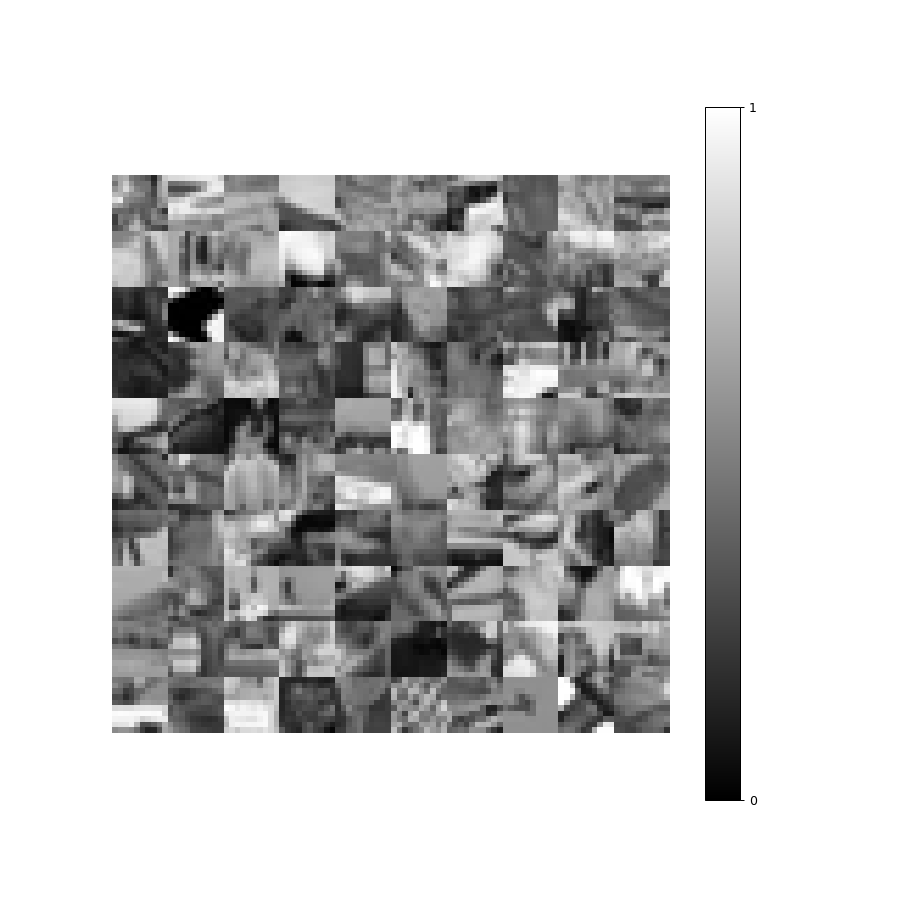

In [85]:
fig = plt.figure(figsize=(10, 10))

draw_weights(flat_te, 10, 10, 10, fig)

In [86]:
gp_x10 = cp.asarray(flat_x10)
gp_te = cp.asarray(flat_te)

In [7]:
sl = 10

## Analysis Dialog

Aight bois, let's do this.

<IPython.core.display.Javascript object>


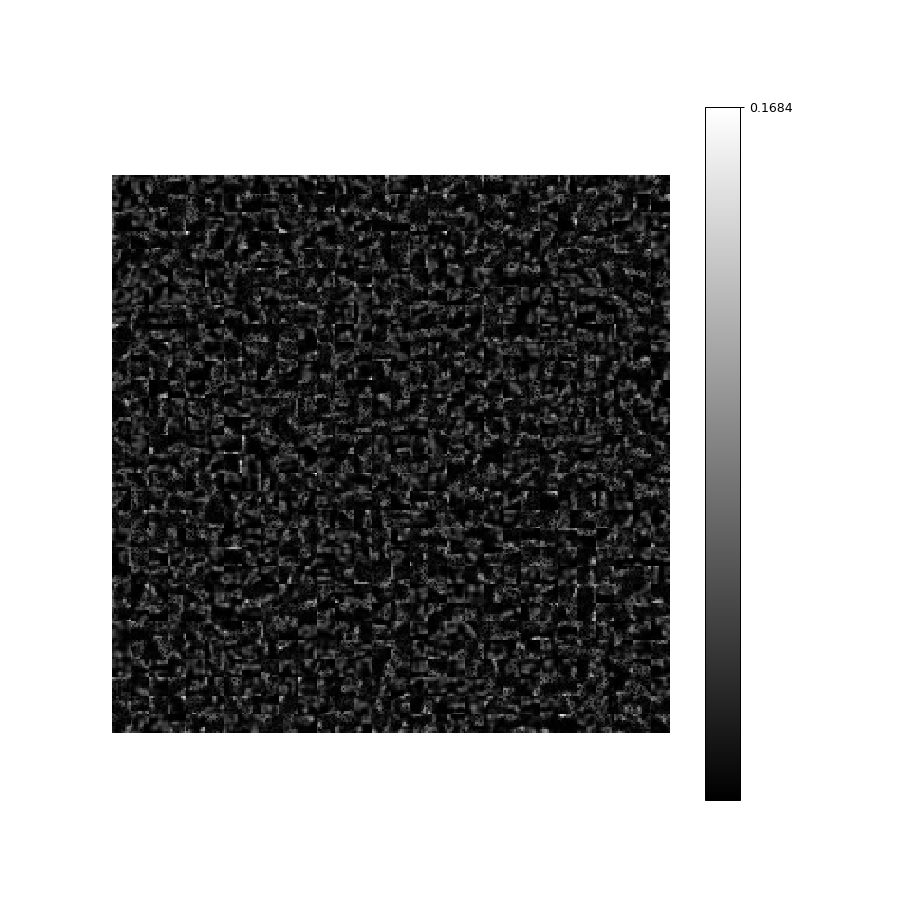

100%|██████████| 10000/10000 [00:05<00:00, 1759.63it/s]


In [8]:
%matplotlib notebook
fig = plt.figure(figsize=(10, 10))

Nep = 10
T_s = 10000
prec = 1e-10

# Sparse Layer
Kx = 30
Ky = 30
sN = Kx * Ky
m_len = sl ** 2

n_w = 20 #Number of winners

sw = cp.random.uniform(0, 0.1, (sN, m_len))
xi = 0.02

for ep in range(Nep):
    inputs = gp_x10[cp.random.permutation(T_s)] 
    
    for i in tqdm(range(T_s)):

        # Handle sparse layer
        v = inputs[i].reshape(-1, 1)
        p = sw @ v
        winners = cp.argsort(p, axis=0)[-n_w:]
        mask = cp.zeros((sN, 1))
        mask[winners] = 1
        so_uw = mask * p
        r = sw.T @ so_uw
        mod_r = cp.maximum(r, prec)
        e = v - r

        sw += sw * so_uw * (e / mod_r).T * xi
        
        sw = cp.clip(sw, 0, 1)

    draw_weights(sw.get(), Kx, Ky, sl, fig)

In [55]:
def reconstruct(img_i, sw):
    v = gp_x10[img_i].reshape(-1, 1)

    p = sw @ v
    winners = cp.argsort(p, axis=0)[-n_w:]
    mask = cp.zeros((sN, 1))
    mask[winners] = 1
    so_uw = mask * p
    r = sw.T @ so_uw

    tap = np.zeros((10, 20))
    tap[:, :10] = v.get().reshape(10, 10)
    tap[:, 10:] = r.get().reshape(10, 10)

    plt.figure(figsize=(2, 1)) # Added this line after many of the trials
    plt.xticks([])
    plt.yticks([])
    plt.imshow(tap, cmap='gray')
    plt.show()

<IPython.core.display.Javascript object>


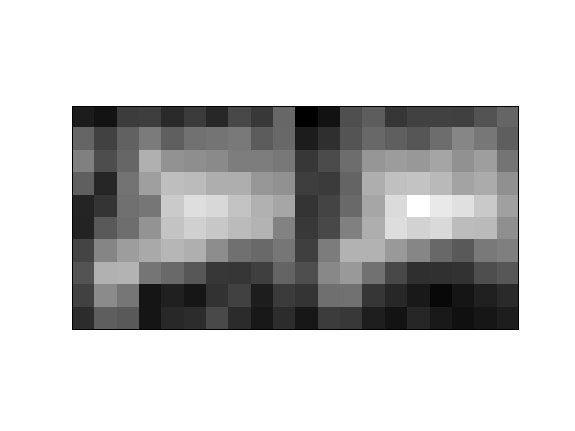

<IPython.core.display.Javascript object>


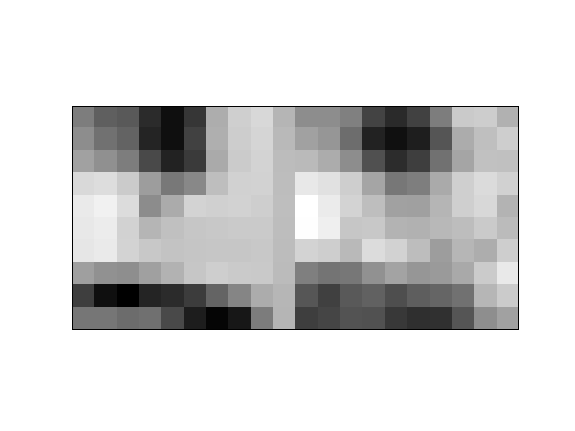

<IPython.core.display.Javascript object>


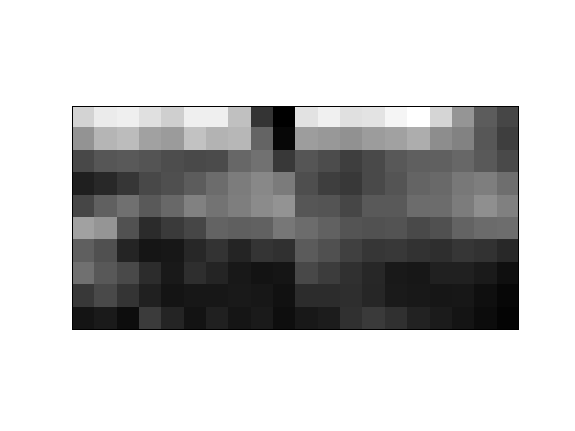

<IPython.core.display.Javascript object>


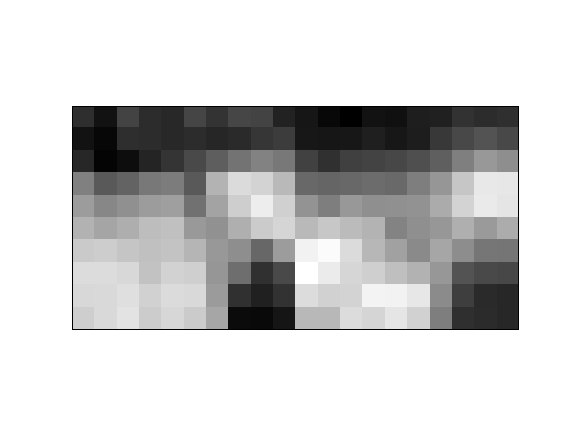

<IPython.core.display.Javascript object>


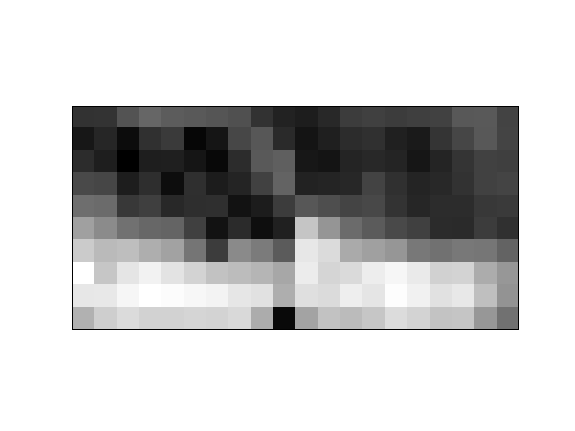

<IPython.core.display.Javascript object>


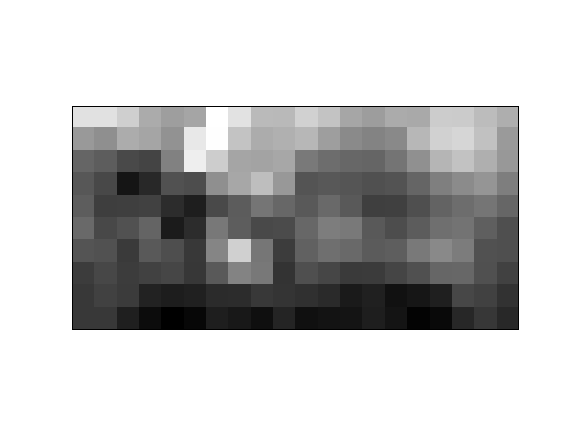

<IPython.core.display.Javascript object>


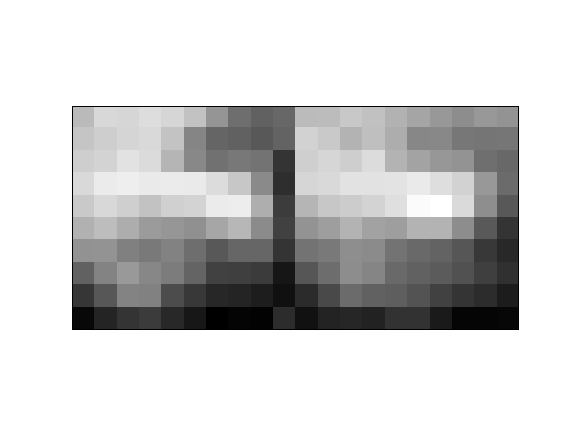

<IPython.core.display.Javascript object>


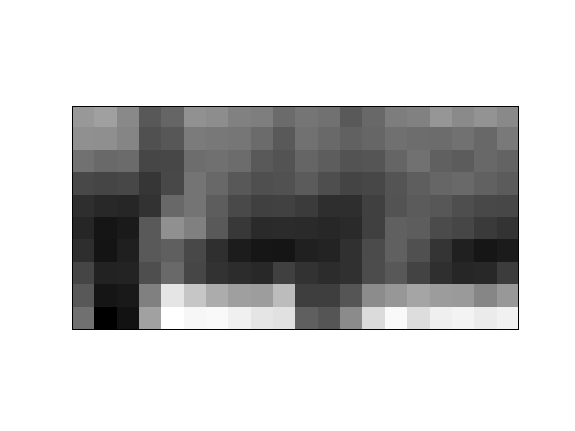

<IPython.core.display.Javascript object>


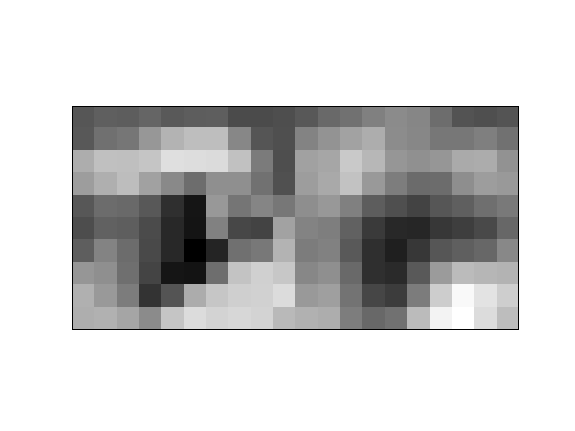

<IPython.core.display.Javascript object>


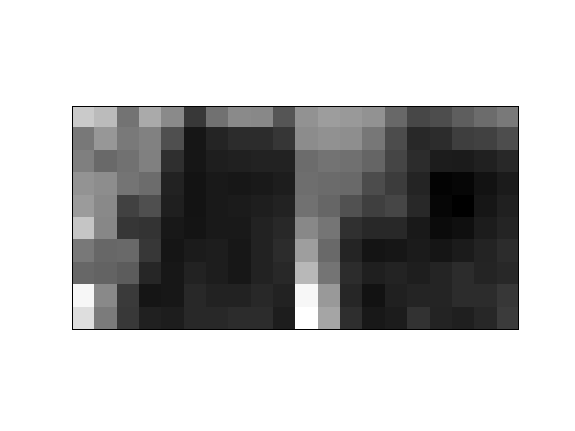

In [28]:
for i in range(10):
    reconstruct(i, sw)

Well, the reconstructions aren't perfect, but they're pretty darn good.  I'm going to train the network again, but this time with 30 winners, and see what that looks like.

<IPython.core.display.Javascript object>


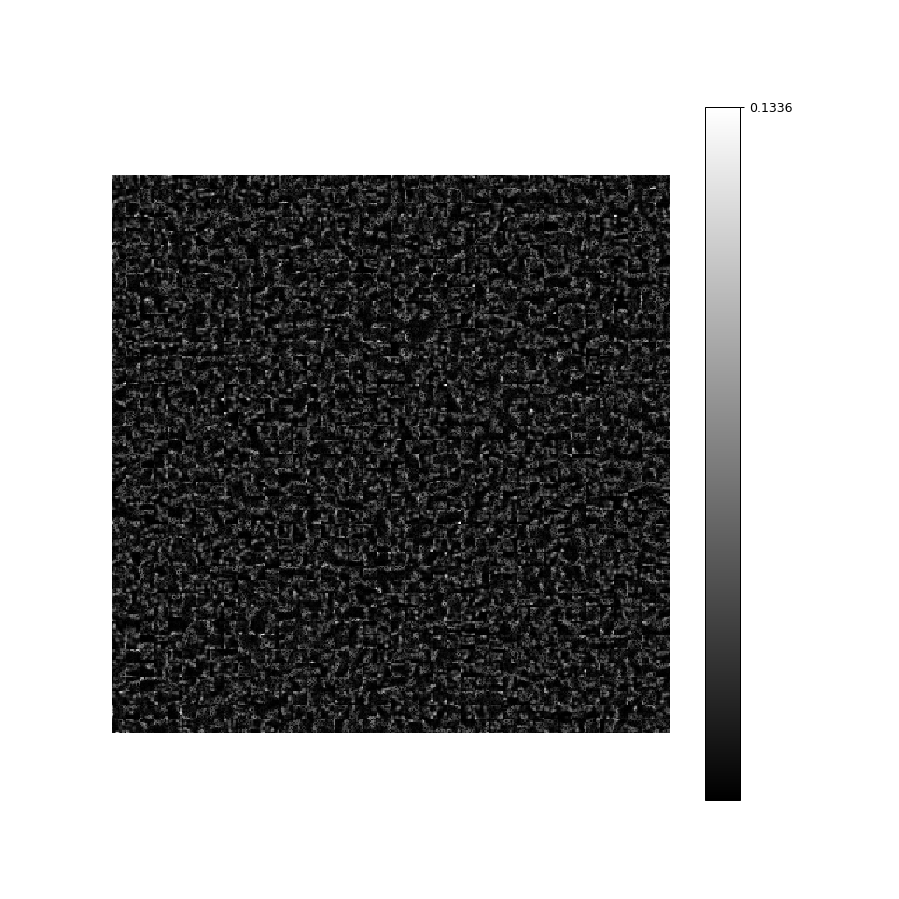

100%|██████████| 10000/10000 [00:05<00:00, 1818.53it/s]


In [30]:
%matplotlib notebook
fig = plt.figure(figsize=(10, 10))

Nep = 10
T_s = 10000
prec = 1e-10

# Sparse Layer
Kx = 40
Ky = 40
sN = Kx * Ky
m_len = sl ** 2

n_w = 30 #Number of winners

sw = cp.random.uniform(0, 0.2, (sN, m_len))
xi = 0.02

for ep in range(Nep):
    inputs = gp_x10[cp.random.permutation(T_s)] 
    
    for i in tqdm(range(T_s)):

        # Handle sparse layer
        v = inputs[i].reshape(-1, 1)
        p = sw @ v
        winners = cp.argsort(p, axis=0)[-n_w:]
        mask = cp.zeros((sN, 1))
        mask[winners] = 1
        so_uw = mask * p
        r = sw.T @ so_uw
        mod_r = cp.maximum(r, prec)
        e = v - r

        sw += sw * so_uw * (e / mod_r).T * xi
        
        sw = cp.clip(sw, 0, 1)

    draw_weights(sw.get(), Kx, Ky, sl, fig)

<IPython.core.display.Javascript object>


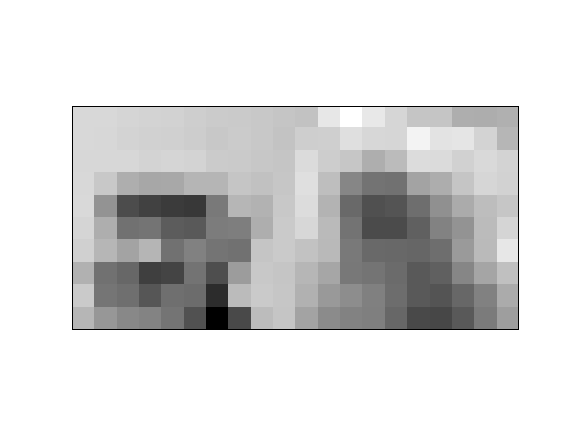

<IPython.core.display.Javascript object>


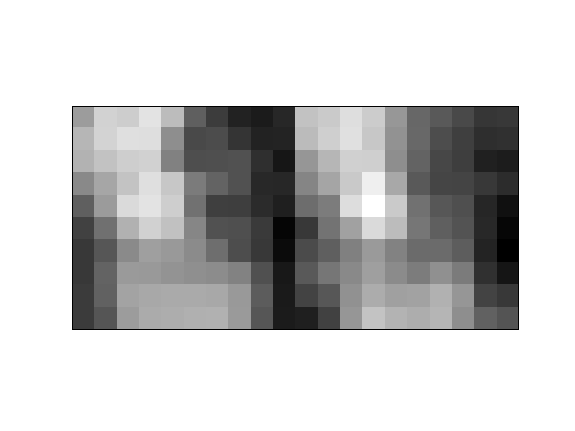

<IPython.core.display.Javascript object>


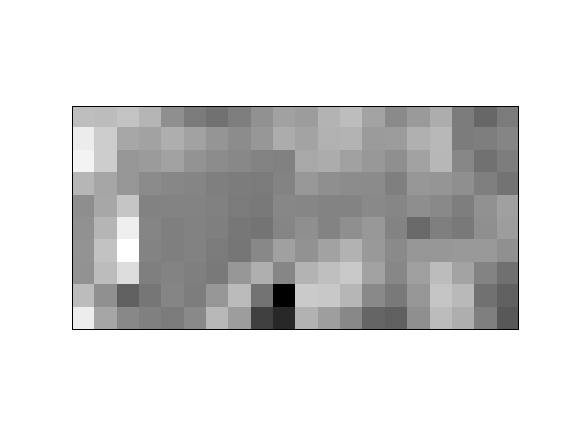

<IPython.core.display.Javascript object>


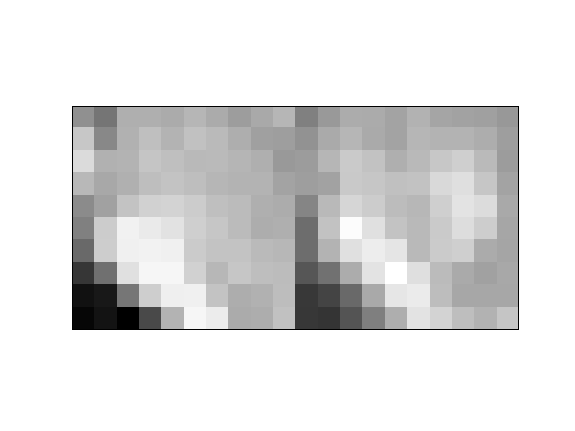

<IPython.core.display.Javascript object>


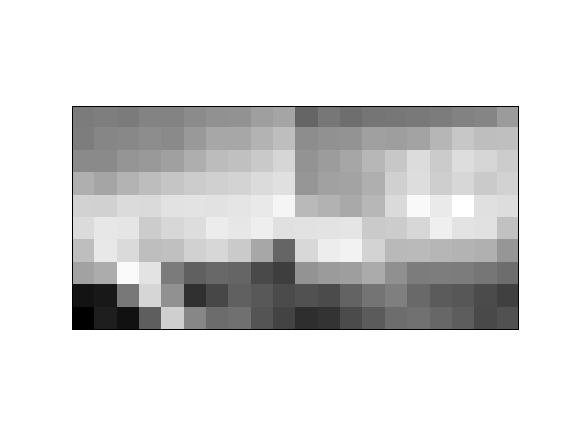

<IPython.core.display.Javascript object>


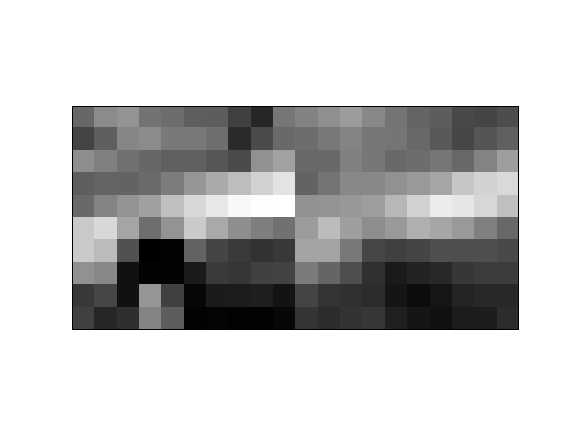

<IPython.core.display.Javascript object>


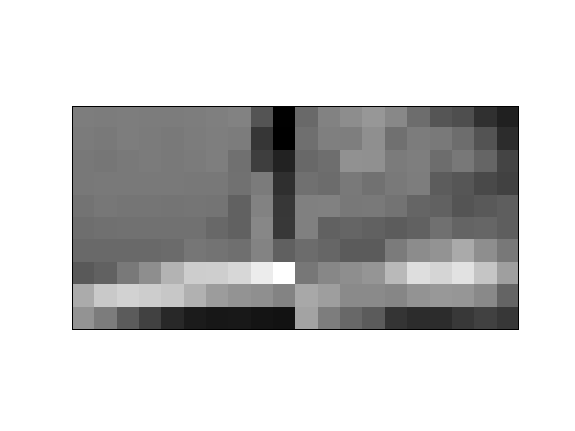

<IPython.core.display.Javascript object>


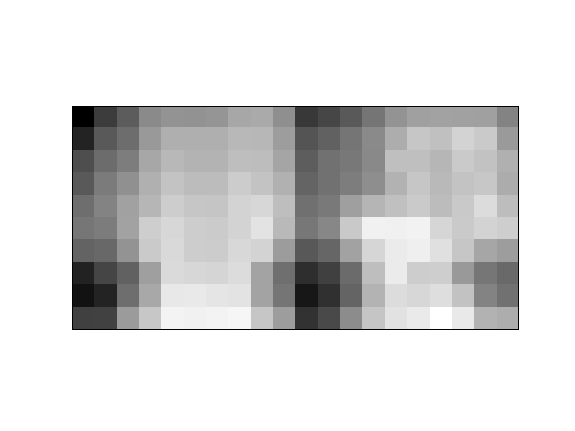

<IPython.core.display.Javascript object>


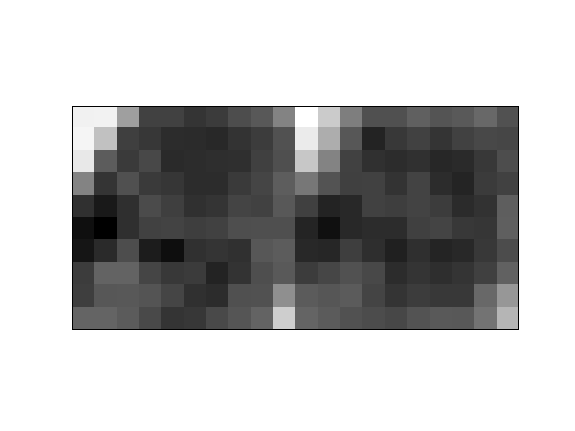

<IPython.core.display.Javascript object>


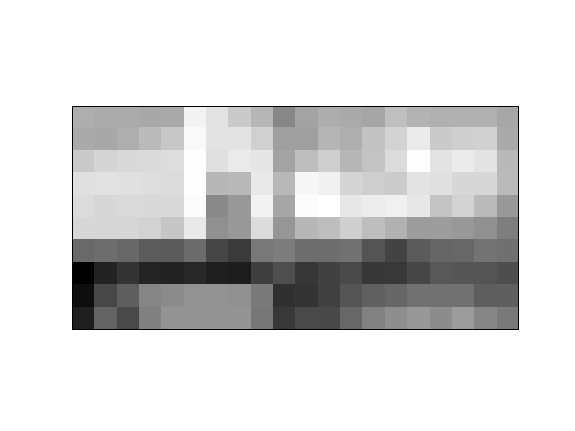

In [32]:
offset = 100

for i in range(10):
    reconstruct(offset + i, sw)

Interesting.  Again, pretty good reconstructions.  And that's dope.  I think it'll probably be key to focus only on a small aspect of the image at a time, and form a "world model" by looking around the bigger image.  

Hmm. Ok, I have half I mind to shut this down right now, but I think I'm going to train a super big network with like 20 winners.  I'll do that and then be done.  Also, notice that this network I just trained was training *faster* than the previous one?? Man, I love my p-instance.

Ok, let's do this.

<IPython.core.display.Javascript object>


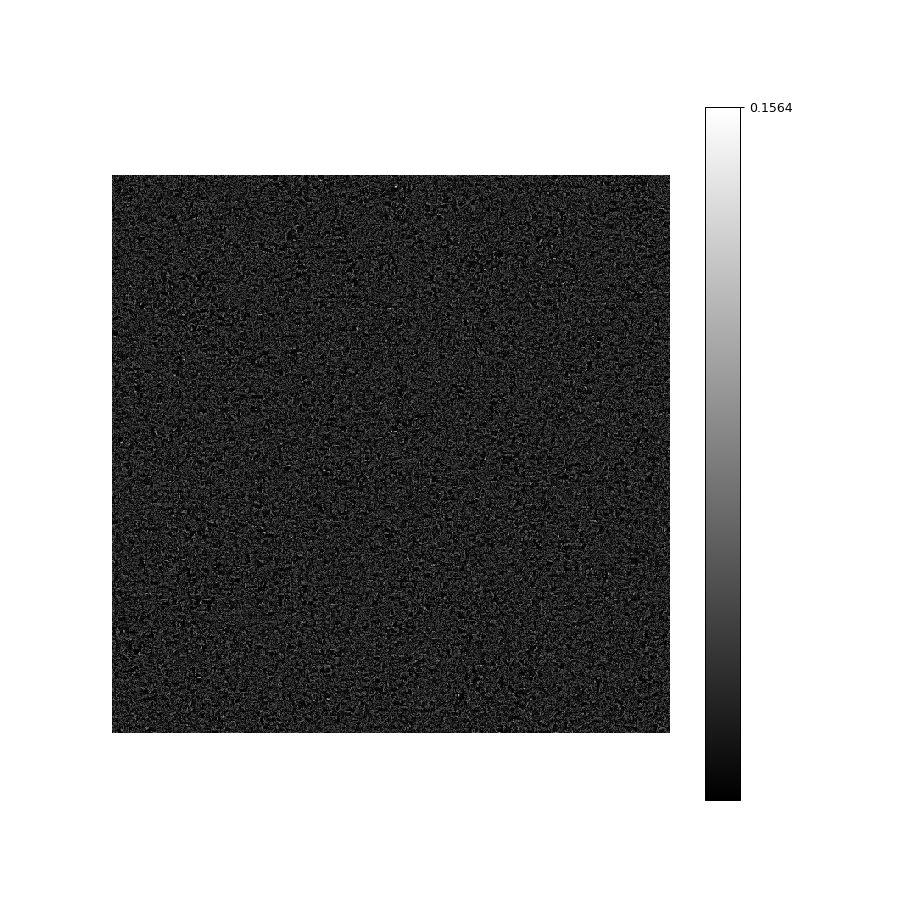

100%|██████████| 10000/10000 [00:05<00:00, 1677.14it/s]


In [34]:
%matplotlib notebook
fig = plt.figure(figsize=(10, 10))

Nep = 20
T_s = 10000
prec = 1e-10

# Sparse Layer
Kx = 100
Ky = 100
sN = Kx * Ky
m_len = sl ** 2

n_w = 20 #Number of winners

sw = cp.random.uniform(0, 0.2, (sN, m_len))
xi = 0.02

for ep in range(Nep):
    inputs = gp_x10[cp.random.permutation(T_s)] 
    
    for i in tqdm(range(T_s)):

        # Handle sparse layer
        v = inputs[i].reshape(-1, 1)
        p = sw @ v
        winners = cp.argsort(p, axis=0)[-n_w:]
        mask = cp.zeros((sN, 1))
        mask[winners] = 1
        so_uw = mask * p
        r = sw.T @ so_uw
        mod_r = cp.maximum(r, prec)
        e = v - r

        sw += sw * so_uw * (e / mod_r).T * xi
        
        sw = cp.clip(sw, 0, 1)

    draw_weights(sw.get(), Kx, Ky, sl, fig)

It's honestly unreal how fast the p-instance is.  I wonder what it'll do when I directly access the underlying architecture with CUDA.

<IPython.core.display.Javascript object>


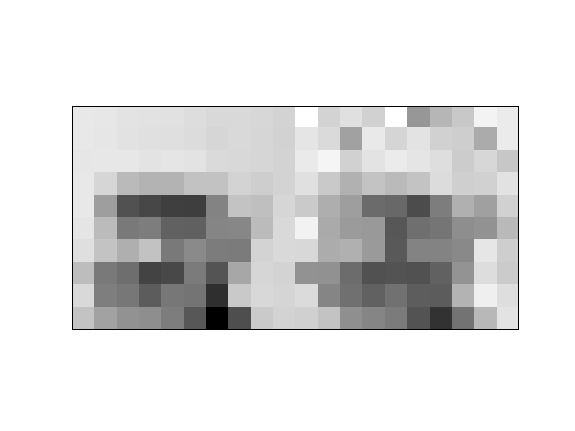

<IPython.core.display.Javascript object>


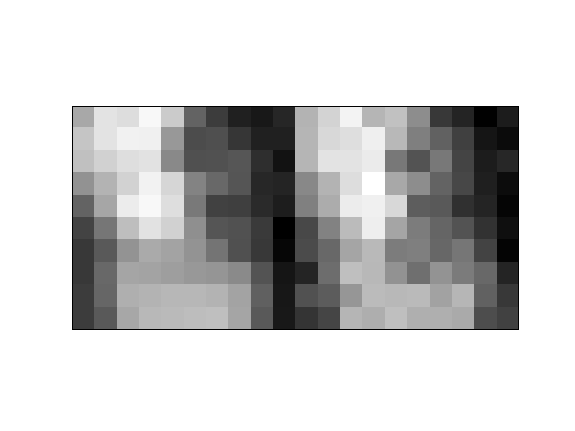

<IPython.core.display.Javascript object>


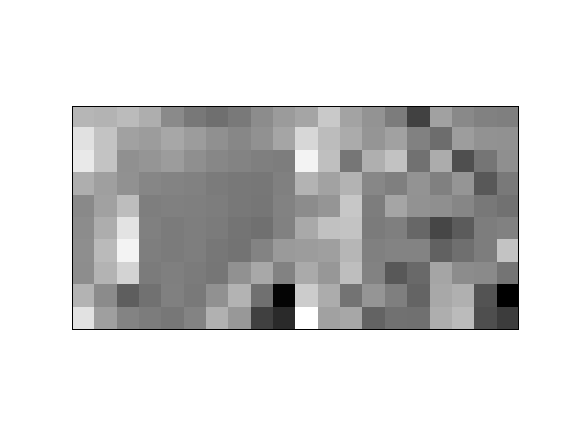

<IPython.core.display.Javascript object>


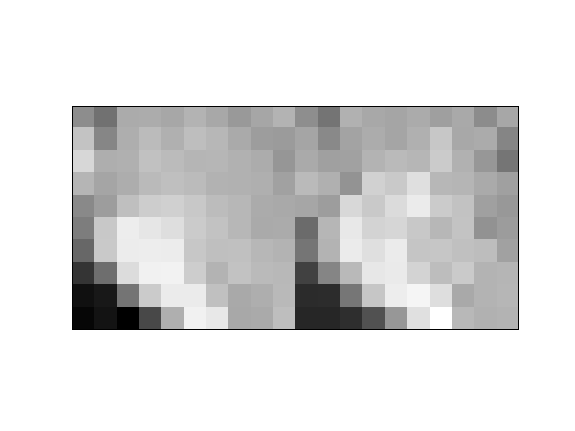

<IPython.core.display.Javascript object>


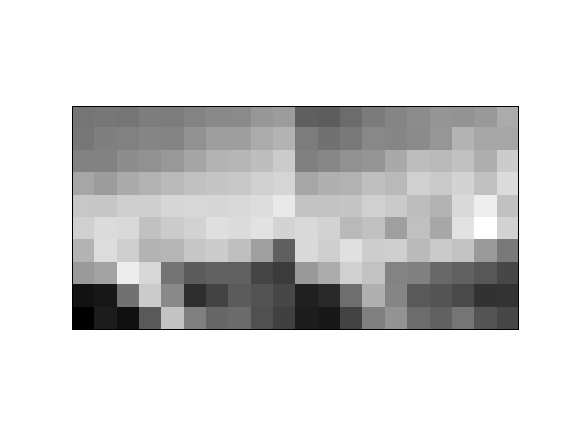

<IPython.core.display.Javascript object>


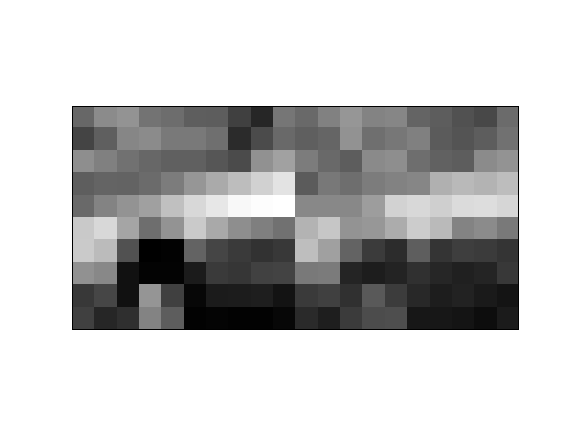

<IPython.core.display.Javascript object>


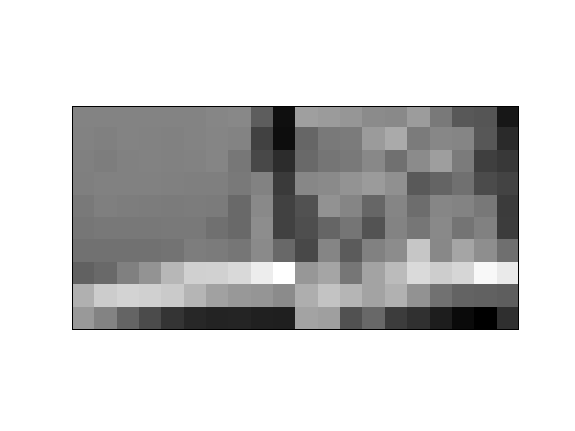

<IPython.core.display.Javascript object>


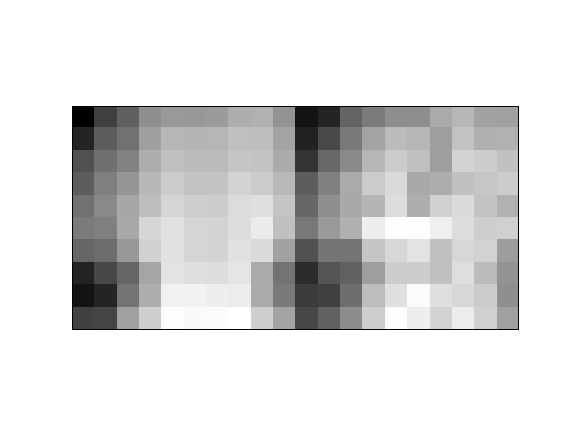

<IPython.core.display.Javascript object>


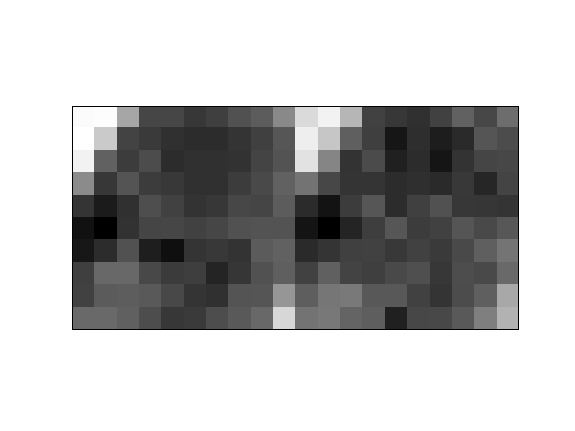

<IPython.core.display.Javascript object>


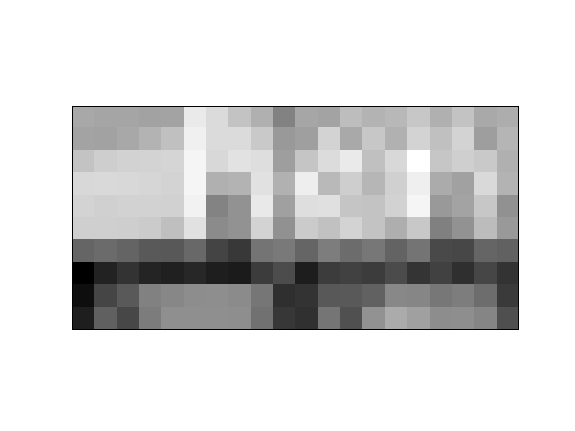

In [35]:
offset = 100

for i in range(10):
    reconstruct(offset + i, sw)

Hmm.  Ideally, this bad boi should be able to reconstruct the image perfectly.  I'm going to decrease the learning constant, and train on more epochs.

<IPython.core.display.Javascript object>


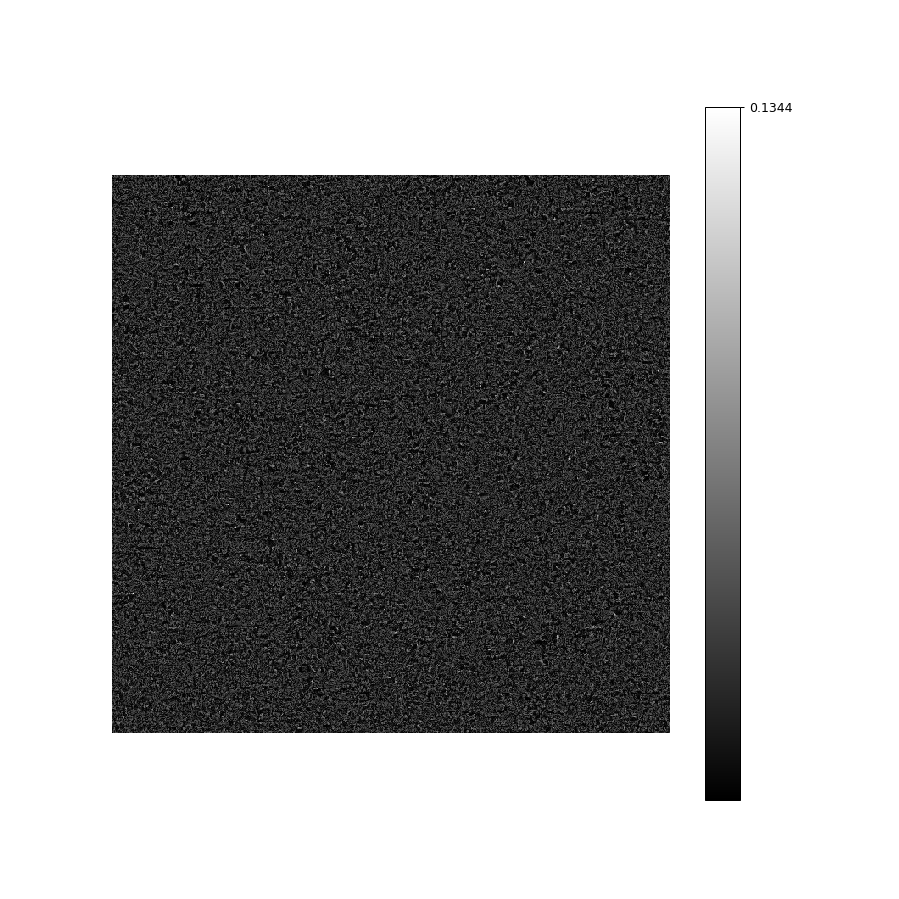

100%|██████████| 10000/10000 [00:05<00:00, 1826.77it/s]


In [37]:
%matplotlib notebook
fig = plt.figure(figsize=(10, 10))

Nep = 40
T_s = 10000
prec = 1e-10

# Sparse Layer
Kx = 100
Ky = 100
sN = Kx * Ky
m_len = sl ** 2

n_w = 20 #Number of winners

sw = cp.random.uniform(0, 0.2, (sN, m_len))
xi = 0.008

for ep in range(Nep):
    inputs = gp_x10[cp.random.permutation(T_s)] 
    
    for i in tqdm(range(T_s)):

        # Handle sparse layer
        v = inputs[i].reshape(-1, 1)
        p = sw @ v
        winners = cp.argsort(p, axis=0)[-n_w:]
        mask = cp.zeros((sN, 1))
        mask[winners] = 1
        so_uw = mask * p
        r = sw.T @ so_uw
        mod_r = cp.maximum(r, prec)
        e = v - r

        sw += sw * so_uw * (e / mod_r).T * xi
        
#         sw = cp.clip(sw, 0, 1)

    draw_weights(sw.get(), Kx, Ky, sl, fig)

Shoot. I don't know if that was enough.  Anyway, I'm going to plot some of the prototypes.

<IPython.core.display.Javascript object>


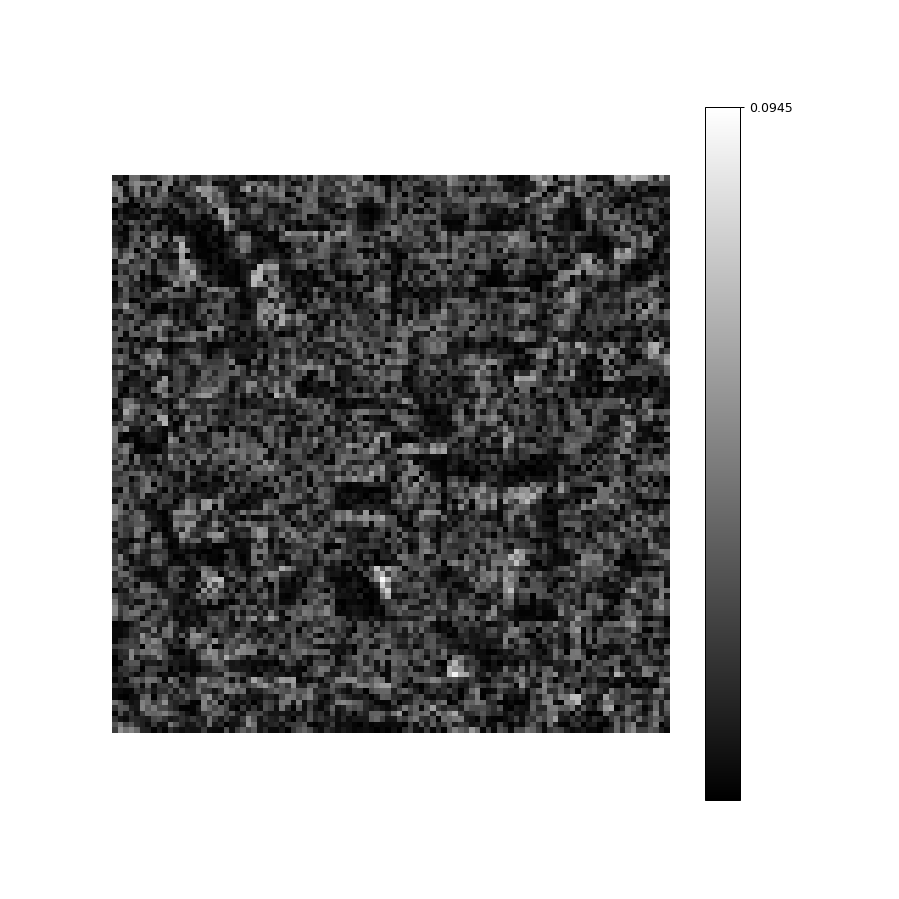

In [42]:
fig = plt.figure(figsize=(10,10))

draw_weights(sw.get(), 10, 10, sl, fig)

Wow, this is kinda wild, but I think there are too many winners.  I'm going to train that network more, do reconstructions, and then maybe take things down to 10 winners, see what happens.

<IPython.core.display.Javascript object>


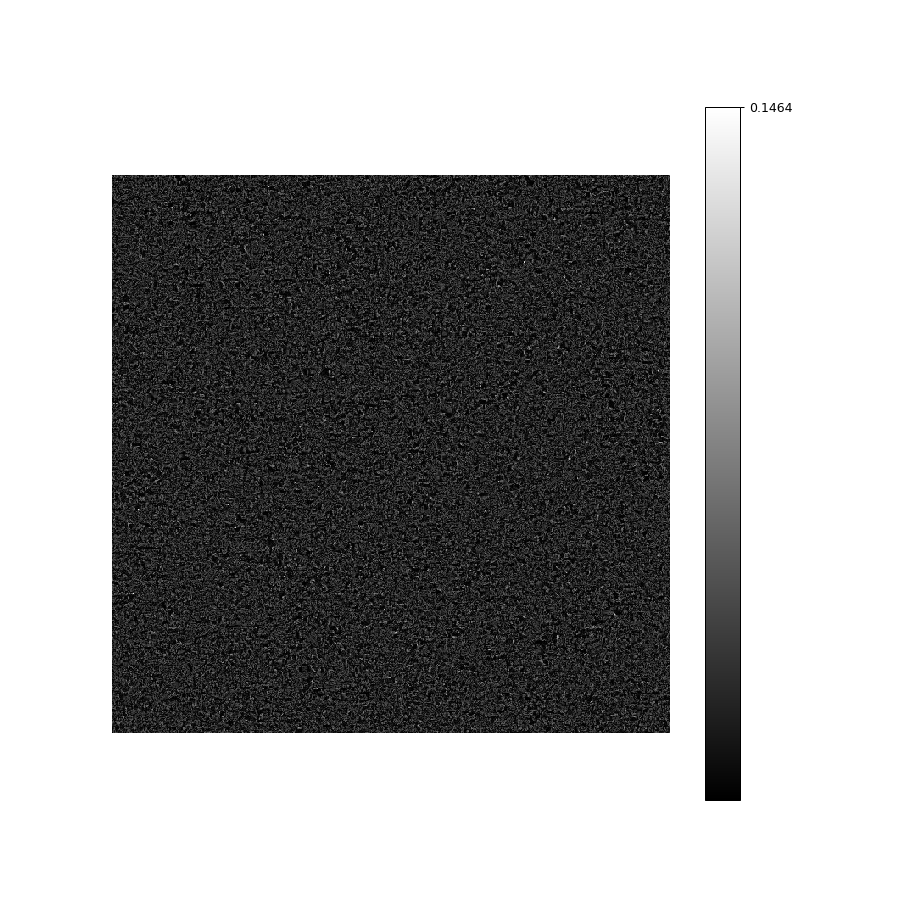

100%|██████████| 10000/10000 [00:05<00:00, 1723.48it/s]


In [43]:
%matplotlib notebook
fig = plt.figure(figsize=(10, 10))

Nep = 20

for ep in range(Nep):
    inputs = gp_x10[cp.random.permutation(T_s)] 
    
    for i in tqdm(range(T_s)):

        # Handle sparse layer
        v = inputs[i].reshape(-1, 1)
        p = sw @ v
        winners = cp.argsort(p, axis=0)[-n_w:]
        mask = cp.zeros((sN, 1))
        mask[winners] = 1
        so_uw = mask * p
        r = sw.T @ so_uw
        mod_r = cp.maximum(r, prec)
        e = v - r

        sw += sw * so_uw * (e / mod_r).T * xi
        
#         sw = cp.clip(sw, 0, 1)

    draw_weights(sw.get(), Kx, Ky, sl, fig)

<IPython.core.display.Javascript object>


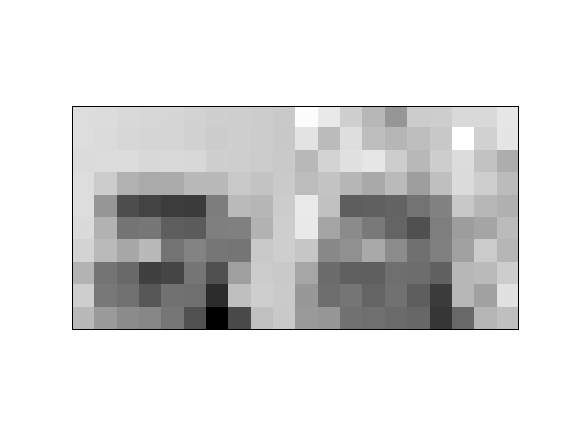

<IPython.core.display.Javascript object>


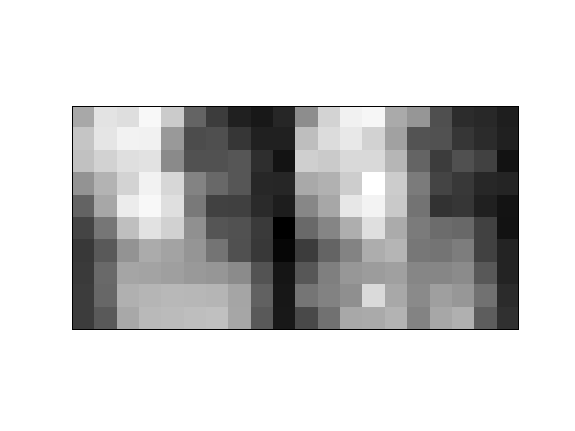

<IPython.core.display.Javascript object>


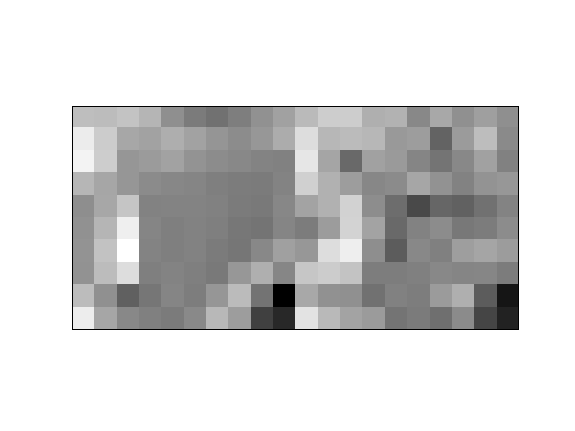

<IPython.core.display.Javascript object>


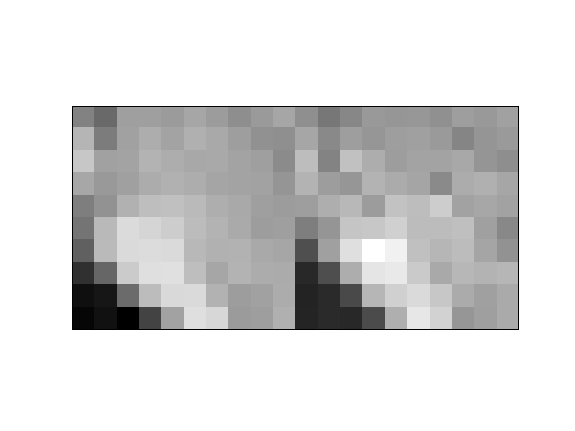

<IPython.core.display.Javascript object>


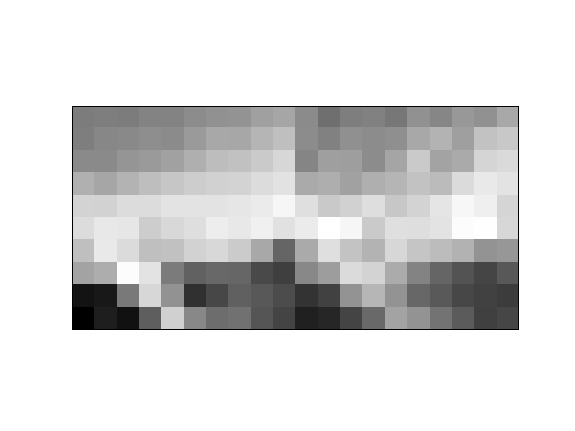

<IPython.core.display.Javascript object>


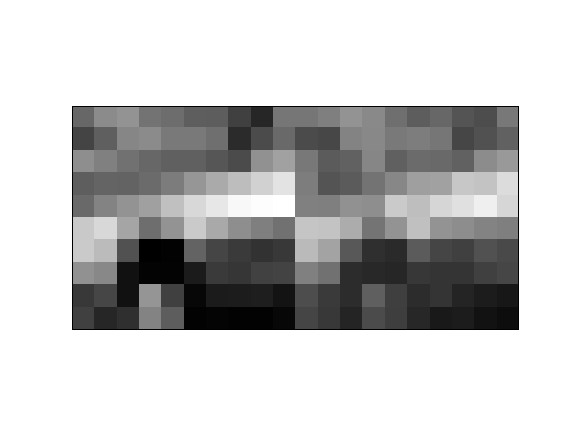

<IPython.core.display.Javascript object>


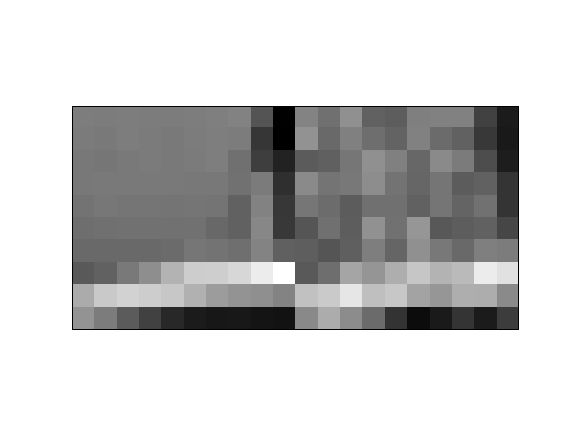

<IPython.core.display.Javascript object>


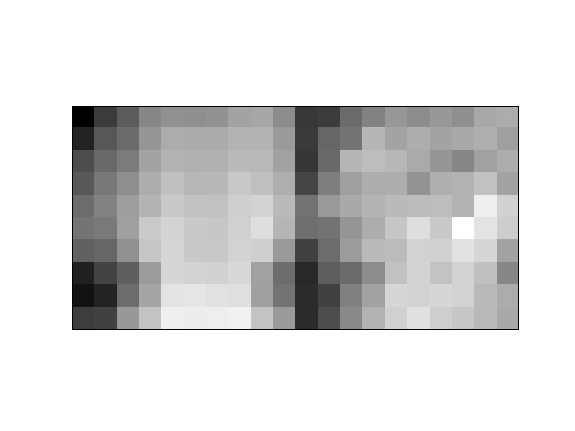

<IPython.core.display.Javascript object>


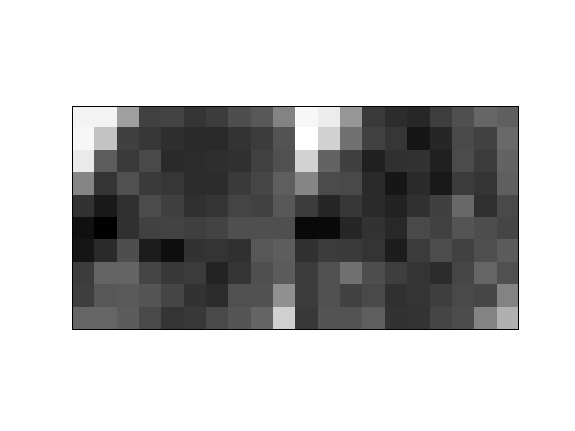

<IPython.core.display.Javascript object>


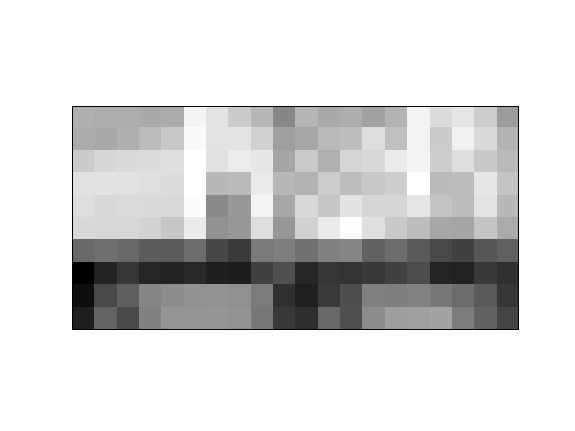

In [44]:
offset = 100

for i in range(10):
    reconstruct(offset + i, sw)

<IPython.core.display.Javascript object>


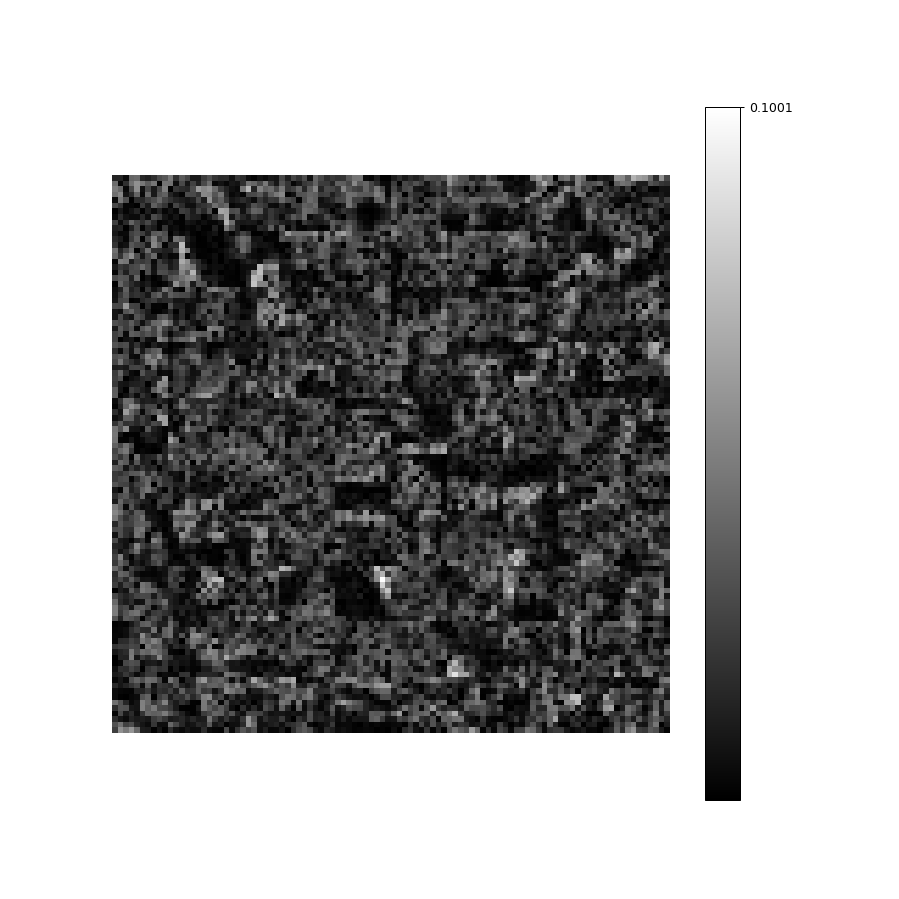

In [45]:
fig = plt.figure(figsize=(10,10))

draw_weights(sw.get(), 10, 10, sl, fig)

Yeah, wow the prototypes just look kinda...splotchy.  Almost like they're not picking up on local structure.  Yeah, let's see how 10 winners does.

<IPython.core.display.Javascript object>


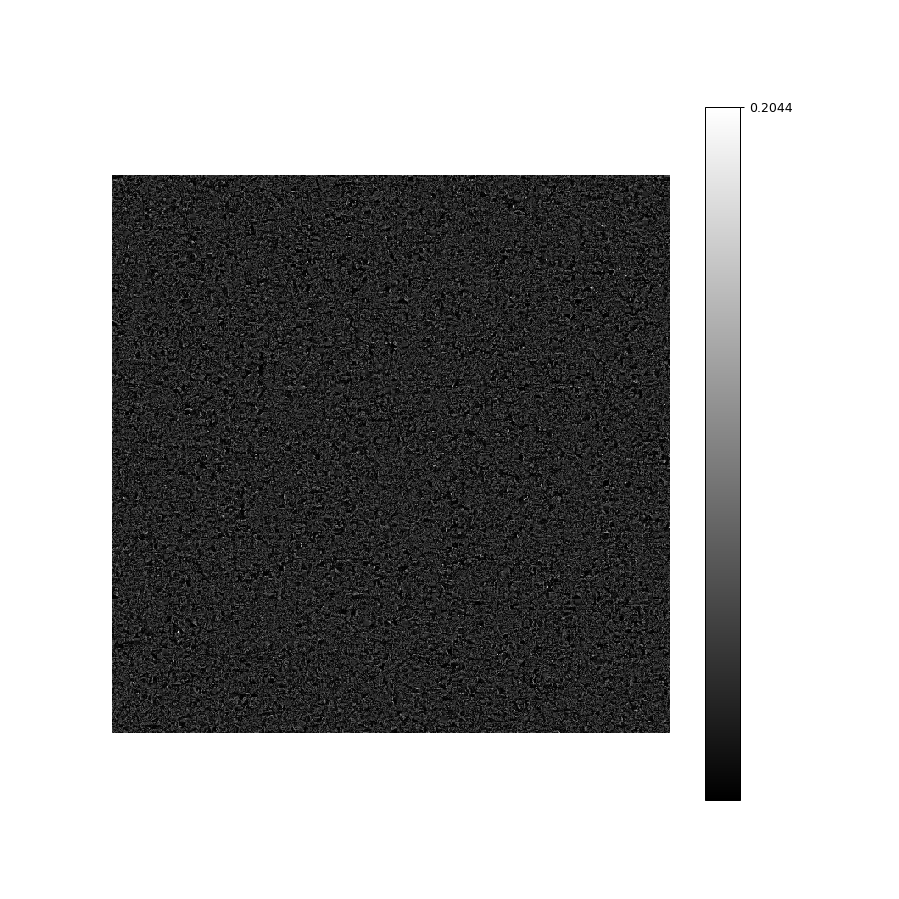

100%|██████████| 10000/10000 [00:05<00:00, 1811.09it/s]


In [46]:
%matplotlib notebook
fig = plt.figure(figsize=(10, 10))

Nep = 40
T_s = 10000
prec = 1e-10

# Sparse Layer
Kx = 100
Ky = 100
sN = Kx * Ky
m_len = sl ** 2

n_w = 10 #Number of winners

sw = cp.random.uniform(0, 0.2, (sN, m_len))
xi = 0.02

for ep in range(Nep):
    inputs = gp_x10[cp.random.permutation(T_s)] 
    
    for i in tqdm(range(T_s)):

        # Handle sparse layer
        v = inputs[i].reshape(-1, 1)
        p = sw @ v
        winners = cp.argsort(p, axis=0)[-n_w:]
        mask = cp.zeros((sN, 1))
        mask[winners] = 1
        so_uw = mask * p
        r = sw.T @ so_uw
        mod_r = cp.maximum(r, prec)
        e = v - r

        sw += sw * so_uw * (e / mod_r).T * xi
        
#         sw = cp.clip(sw, 0, 1)

    draw_weights(sw.get(), Kx, Ky, sl, fig)

<IPython.core.display.Javascript object>


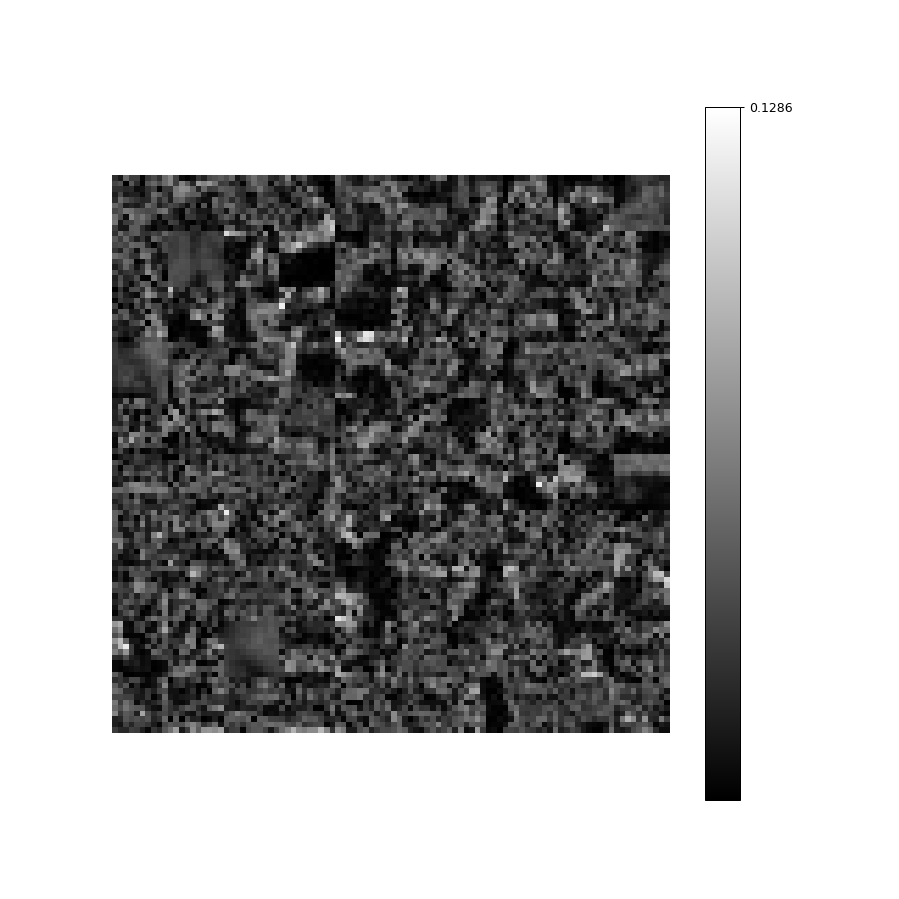

In [49]:
fig = plt.figure(figsize=(10,10))

draw_weights(sw.get()[40:], 10, 10, sl, fig)

Well, let's see. 

Actually, a quick thing.  One aspect of this that's pretty cool is I'm getting some prototypes that are pretty clearly more smooth and low-frequency.  Maybe that's just cause they're getting more training.  Idk.  Anyway.  I'm a big fan of smoothness.

<IPython.core.display.Javascript object>


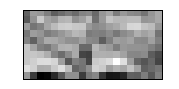

<IPython.core.display.Javascript object>


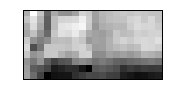

<IPython.core.display.Javascript object>


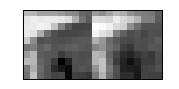

<IPython.core.display.Javascript object>


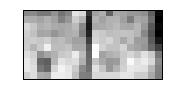

<IPython.core.display.Javascript object>


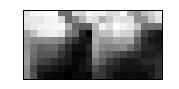

<IPython.core.display.Javascript object>


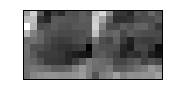

<IPython.core.display.Javascript object>


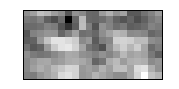

<IPython.core.display.Javascript object>


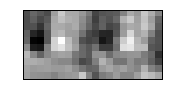

<IPython.core.display.Javascript object>


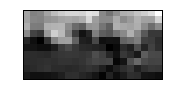

<IPython.core.display.Javascript object>


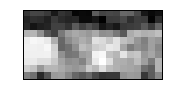

In [56]:
offset = 30

for i in range(10):
    reconstruct(offset + i, sw)

Hmm. I don't really know what to do about this.  Some of the prototypes are just pretty splotchy.  Maybe if I increased the learning constant so they learn more faster.  That's going to be the last thing I try.

<IPython.core.display.Javascript object>


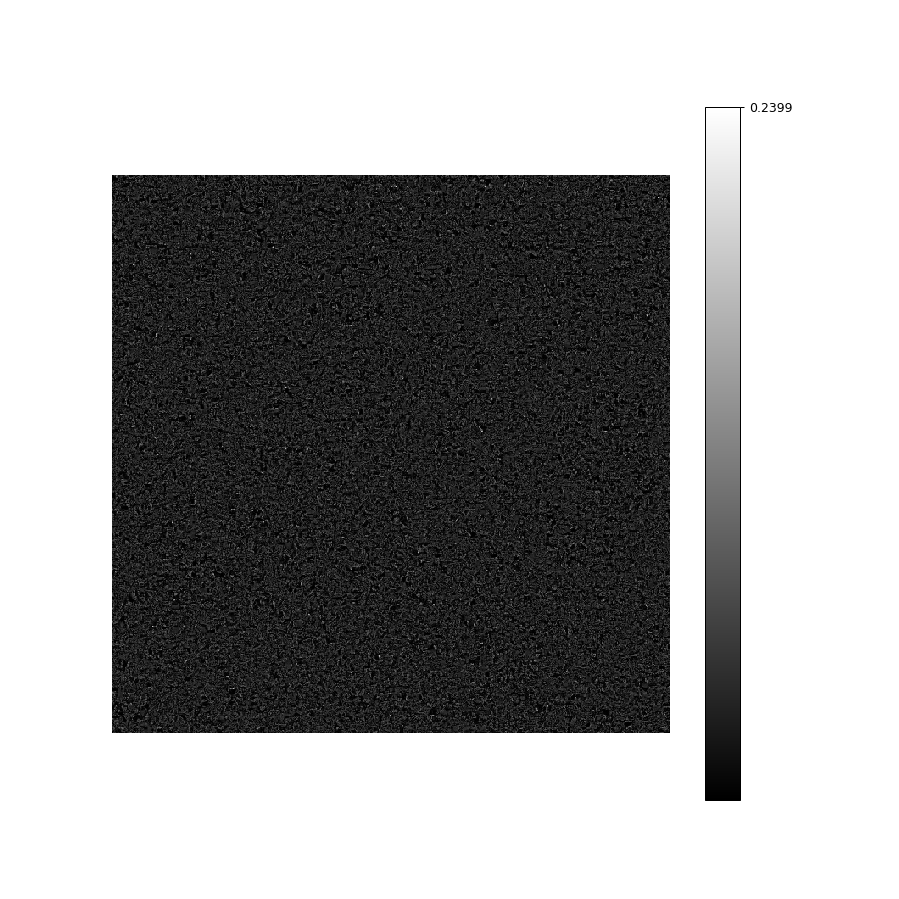

100%|██████████| 10000/10000 [00:05<00:00, 1834.47it/s]


In [58]:
%matplotlib notebook
fig = plt.figure(figsize=(10, 10))

Nep = 20
T_s = 10000
prec = 1e-10

# Sparse Layer
Kx = 100
Ky = 100
sN = Kx * Ky
m_len = sl ** 2

n_w = 10 #Number of winners

sw = cp.random.uniform(0, 0.2, (sN, m_len))
xi = 0.05

for ep in range(Nep):
    inputs = gp_x10[cp.random.permutation(T_s)] 
    
    for i in tqdm(range(T_s)):

        # Handle sparse layer
        v = inputs[i].reshape(-1, 1)
        p = sw @ v
        winners = cp.argsort(p, axis=0)[-n_w:]
        mask = cp.zeros((sN, 1))
        mask[winners] = 1
        so_uw = mask * p
        r = sw.T @ so_uw
        mod_r = cp.maximum(r, prec)
        e = v - r

        sw += sw * so_uw * (e / mod_r).T * xi
        
    draw_weights(sw.get(), Kx, Ky, sl, fig)

<IPython.core.display.Javascript object>


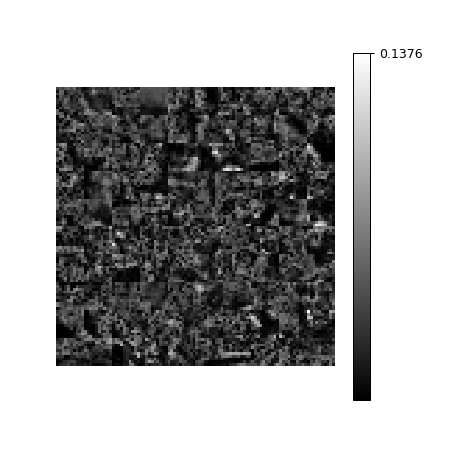

In [60]:
fig = plt.figure(figsize=(5,5))

draw_weights(sw.get()[40:], 10, 10, sl, fig)

<IPython.core.display.Javascript object>


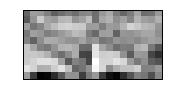

<IPython.core.display.Javascript object>


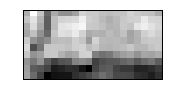

<IPython.core.display.Javascript object>


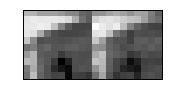

<IPython.core.display.Javascript object>


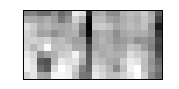

<IPython.core.display.Javascript object>


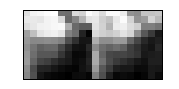

<IPython.core.display.Javascript object>


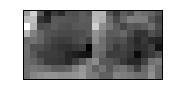

<IPython.core.display.Javascript object>


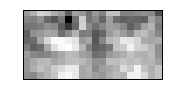

<IPython.core.display.Javascript object>


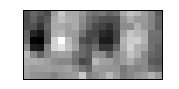

<IPython.core.display.Javascript object>


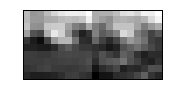

<IPython.core.display.Javascript object>


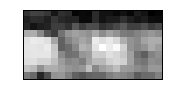

In [61]:
offset = 30

for i in range(10):
    reconstruct(offset + i, sw)

Yeah, I actually think those might be better. Yeah, with that many neurons, it's entirely possible that some of them don't get enough love.  Ok, as a final measure, I'm going to do 5 winners.  Then I'm done.  I promise.

<IPython.core.display.Javascript object>


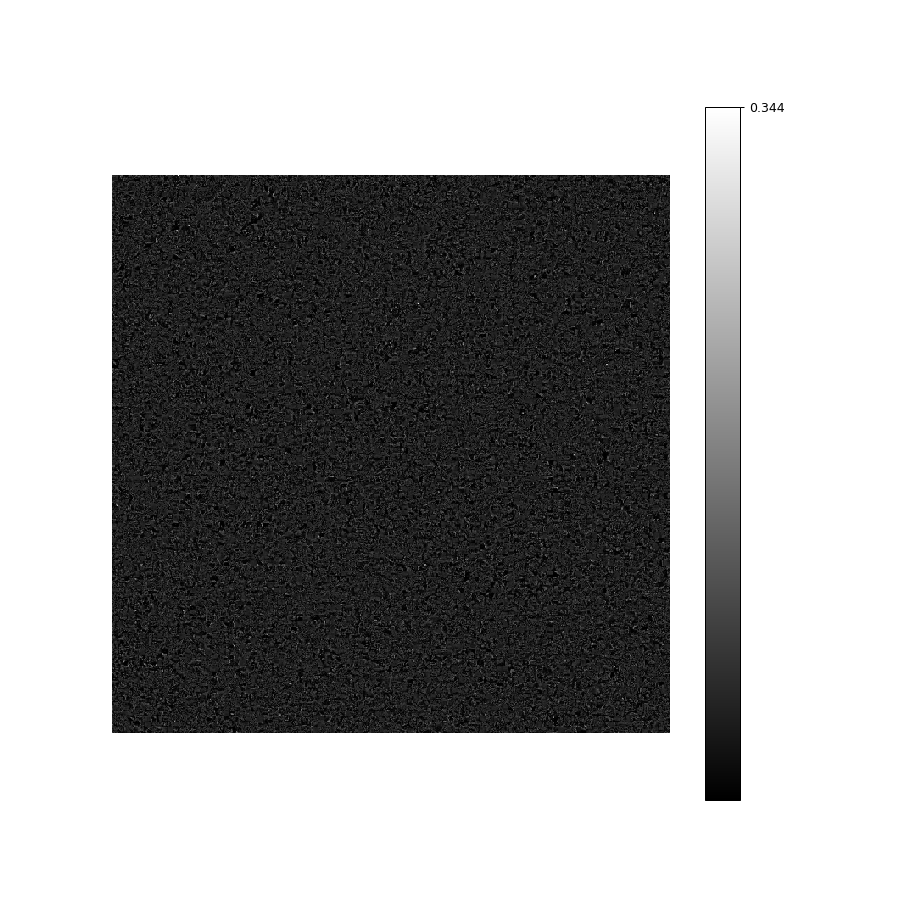

100%|██████████| 10000/10000 [00:05<00:00, 1733.82it/s]


In [62]:
%matplotlib notebook
fig = plt.figure(figsize=(10, 10))

Nep = 20
T_s = 10000
prec = 1e-10

# Sparse Layer
Kx = 100
Ky = 100
sN = Kx * Ky
m_len = sl ** 2

n_w = 5 #Number of winners

sw = cp.random.uniform(0, 0.2, (sN, m_len))
xi = 0.08

for ep in range(Nep):
    inputs = gp_x10[cp.random.permutation(T_s)] 
    
    for i in tqdm(range(T_s)):

        # Handle sparse layer
        v = inputs[i].reshape(-1, 1)
        p = sw @ v
        winners = cp.argsort(p, axis=0)[-n_w:]
        mask = cp.zeros((sN, 1))
        mask[winners] = 1
        so_uw = mask * p
        r = sw.T @ so_uw
        mod_r = cp.maximum(r, prec)
        e = v - r

        sw += sw * so_uw * (e / mod_r).T * xi
        
    draw_weights(sw.get(), Kx, Ky, sl, fig)

<IPython.core.display.Javascript object>


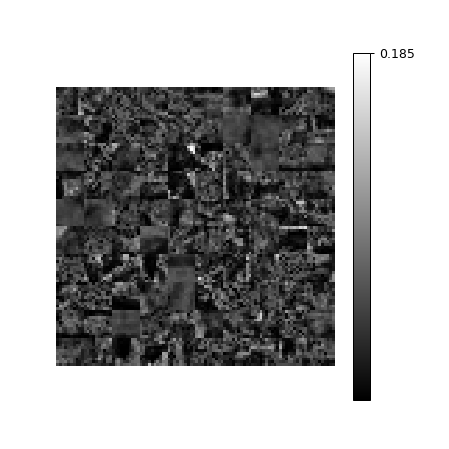

In [64]:
fig = plt.figure(figsize=(5,5))

draw_weights(sw.get()[50:], 10, 10, sl, fig)

<IPython.core.display.Javascript object>


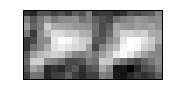

<IPython.core.display.Javascript object>


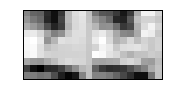

<IPython.core.display.Javascript object>


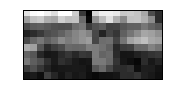

<IPython.core.display.Javascript object>


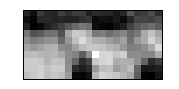

<IPython.core.display.Javascript object>


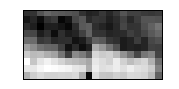

<IPython.core.display.Javascript object>


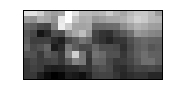

<IPython.core.display.Javascript object>


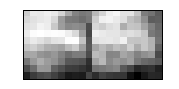

<IPython.core.display.Javascript object>


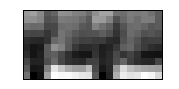

<IPython.core.display.Javascript object>


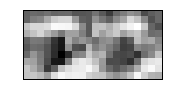

<IPython.core.display.Javascript object>


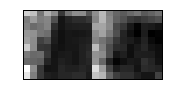

In [67]:
offset = 0

for i in range(10):
    reconstruct(offset + i, sw)

Shoot dang.  Now *those* are pretty darn good. In a bunch of the reconstructions, it almost looks like the reconstruction is smoother than the non-reconstruction.  Actually, I think I have an idea.  I'm doing another round.  I lied.  Sue me.

<IPython.core.display.Javascript object>


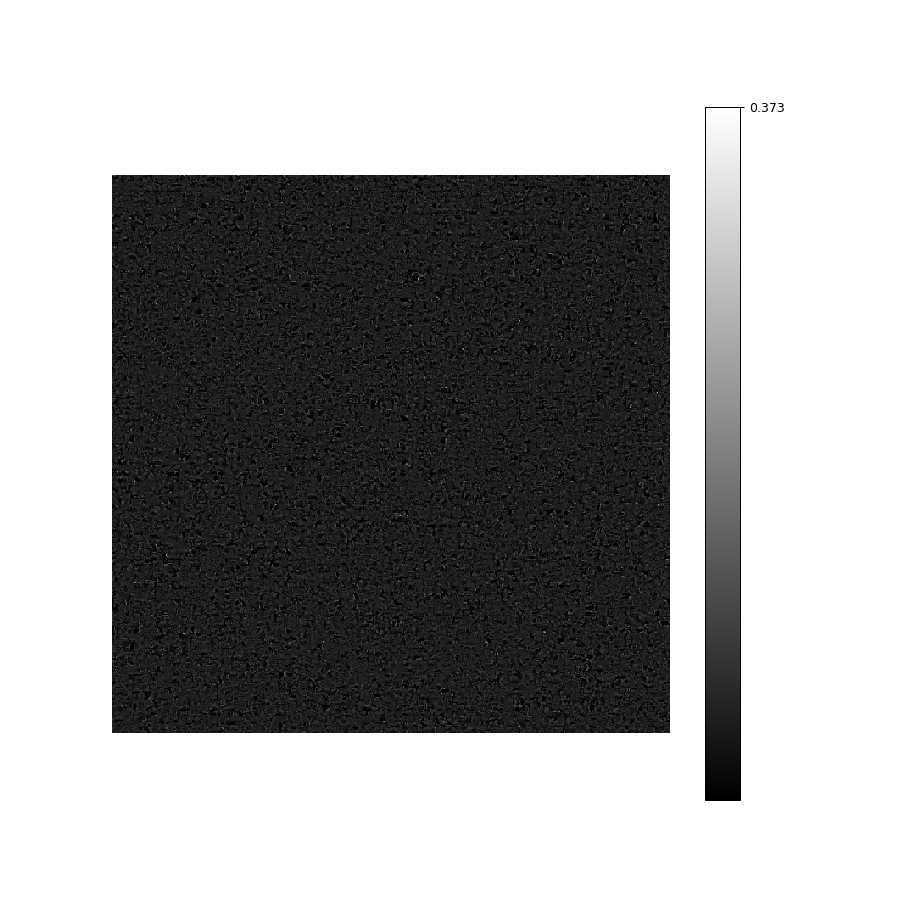

100%|██████████| 10000/10000 [00:05<00:00, 1679.83it/s]


In [70]:
%matplotlib notebook
fig = plt.figure(figsize=(10, 10))

Nep = 20
T_s = 10000
prec = 1e-10

# Sparse Layer
Kx = 100
Ky = 100
sN = Kx * Ky
m_len = sl ** 2

n_w = 5 #Number of winners

sw = cp.random.uniform(0.1, 0.12, (sN, m_len))
xi = 0.08

for ep in range(Nep):
    inputs = gp_x10[cp.random.permutation(T_s)] 
    
    for i in tqdm(range(T_s)):

        # Handle sparse layer
        v = inputs[i].reshape(-1, 1)
        p = sw @ v
        winners = cp.argsort(p, axis=0)[-n_w:]
        mask = cp.zeros((sN, 1))
        mask[winners] = 1
        so_uw = mask * p
        r = sw.T @ so_uw
        mod_r = cp.maximum(r, prec)
        e = v - r

        sw += sw * so_uw * (e / mod_r).T * xi
        
        cp.clip(sw, 0, 1, out=sw)
        
    draw_weights(sw.get(), Kx, Ky, sl, fig)

Now *that* is dope.  If you didn't catch it, I basically initialized the weights to a very homogenous layer.  So I'm basically forcing the network to Michaelangelo this bitch.  By that, I mean the network is forced to "carve" the prototypes from a smooth layer.  Let's take a look.

<IPython.core.display.Javascript object>


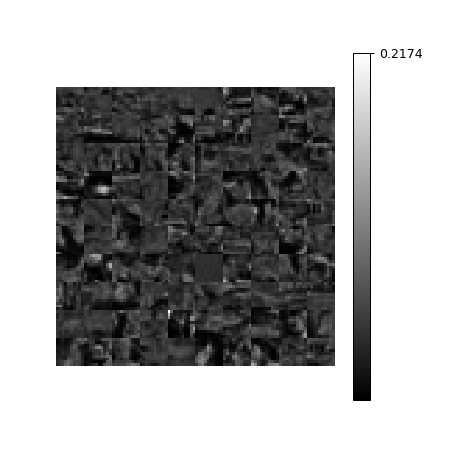

In [77]:
fig = plt.figure(figsize=(5,5))

draw_weights(sw.get()[100:], 10, 10, sl, fig)

<IPython.core.display.Javascript object>


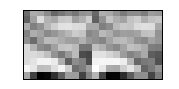

<IPython.core.display.Javascript object>


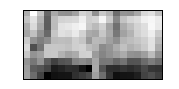

<IPython.core.display.Javascript object>


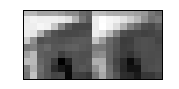

<IPython.core.display.Javascript object>


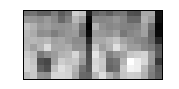

<IPython.core.display.Javascript object>


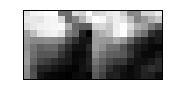

<IPython.core.display.Javascript object>


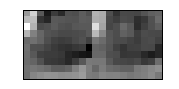

<IPython.core.display.Javascript object>


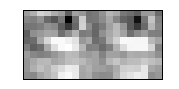

<IPython.core.display.Javascript object>


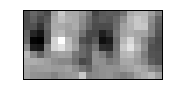

<IPython.core.display.Javascript object>


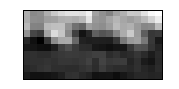

<IPython.core.display.Javascript object>


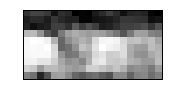

In [76]:
offset = 30

for i in range(10):
    reconstruct(offset + i, sw)

Oh my fucking gosh.  Now *that* is absolutely beautiful.  I'm going to quickly pull the testing data into the scope and see what we come up with.

In [87]:
def reconstruct_te(img_i, sw):
    v = gp_te[img_i].reshape(-1, 1)

    p = sw @ v
    winners = cp.argsort(p, axis=0)[-n_w:]
    mask = cp.zeros((sN, 1))
    mask[winners] = 1
    so_uw = mask * p
    r = sw.T @ so_uw

    tap = np.zeros((10, 20))
    tap[:, :10] = v.get().reshape(10, 10)
    tap[:, 10:] = r.get().reshape(10, 10)

    plt.figure(figsize=(2, 1)) # Added this line after many of the trials
    plt.xticks([])
    plt.yticks([])
    plt.imshow(tap, cmap='gray')
    plt.show()

<IPython.core.display.Javascript object>


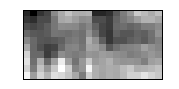

<IPython.core.display.Javascript object>


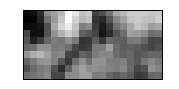

<IPython.core.display.Javascript object>


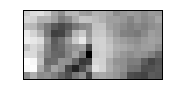

<IPython.core.display.Javascript object>


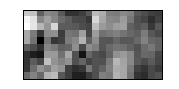

<IPython.core.display.Javascript object>


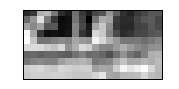

<IPython.core.display.Javascript object>


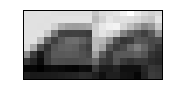

<IPython.core.display.Javascript object>


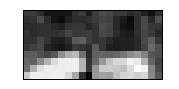

<IPython.core.display.Javascript object>


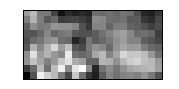

<IPython.core.display.Javascript object>


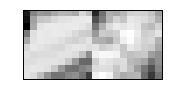

<IPython.core.display.Javascript object>


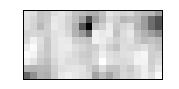

In [92]:
offset = 100

for i in range(10):
    reconstruct_te(offset + i, sw)

Hmm, based on the discrepancy between the test reconstructions and the trained reconstructions, I think my network may be effectively memorizing the inputs.  I'm going to decrease the number of neurons, and the learning constant, and train it one more time.

<IPython.core.display.Javascript object>


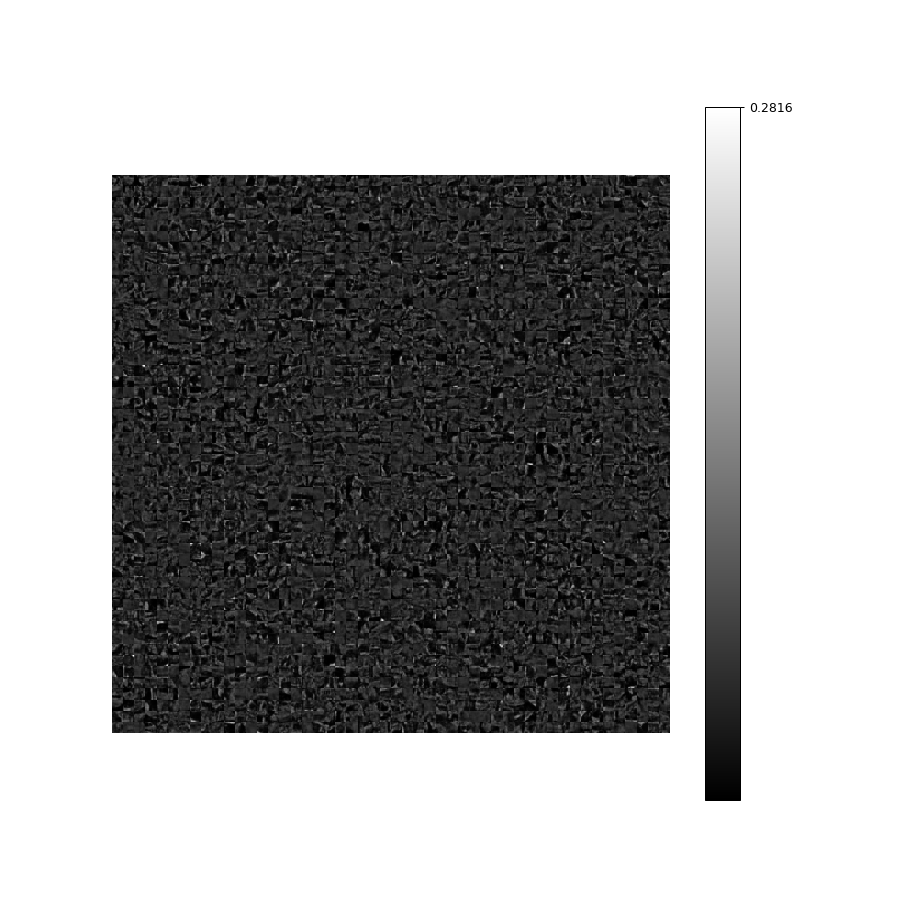

100%|██████████| 10000/10000 [00:05<00:00, 1667.89it/s]


In [97]:
%matplotlib notebook
fig = plt.figure(figsize=(10, 10))

Nep = 20
T_s = 10000
prec = 1e-10

sl = 10

# Sparse Layer
Kx = 50
Ky = 50
sN = Kx * Ky
m_len = sl ** 2

n_w = 5 #Number of winners

sw = cp.random.uniform(0.1, 0.12, (sN, m_len))
xi = 0.04

for ep in range(Nep):
    inputs = gp_x10[cp.random.permutation(T_s)] 
    
    for i in tqdm(range(T_s)):

        # Handle sparse layer
        v = inputs[i].reshape(-1, 1)
        p = sw @ v
        winners = cp.argsort(p, axis=0)[-n_w:]
        mask = cp.zeros((sN, 1))
        mask[winners] = 1
        so_uw = mask * p
        r = sw.T @ so_uw
        mod_r = cp.maximum(r, prec)
        e = v - r

        sw += sw * so_uw * (e / mod_r).T * xi
        
        cp.clip(sw, 0, 1, out=sw)
        
    draw_weights(sw.get(), Kx, Ky, sl, fig)

*That* is absolutely magnificient.  Let's have some fun.

<IPython.core.display.Javascript object>


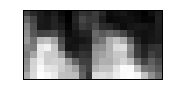

<IPython.core.display.Javascript object>


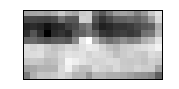

<IPython.core.display.Javascript object>


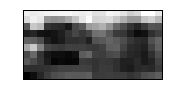

<IPython.core.display.Javascript object>


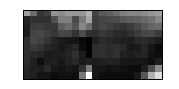

<IPython.core.display.Javascript object>


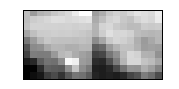

In [99]:
offset = 200

for i in range(5):
    reconstruct_te(offset + i, sw)

<IPython.core.display.Javascript object>


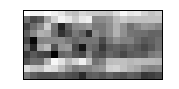

<IPython.core.display.Javascript object>


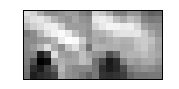

<IPython.core.display.Javascript object>


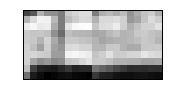

<IPython.core.display.Javascript object>


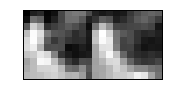

<IPython.core.display.Javascript object>


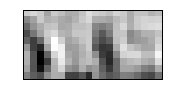

In [101]:
offset = 200

for i in range(5):
    reconstruct(offset + i, sw)

Ok, now that I've found the secret to the universe, I'm going to train a network with the same number of neurons, but 10 winners.

<IPython.core.display.Javascript object>


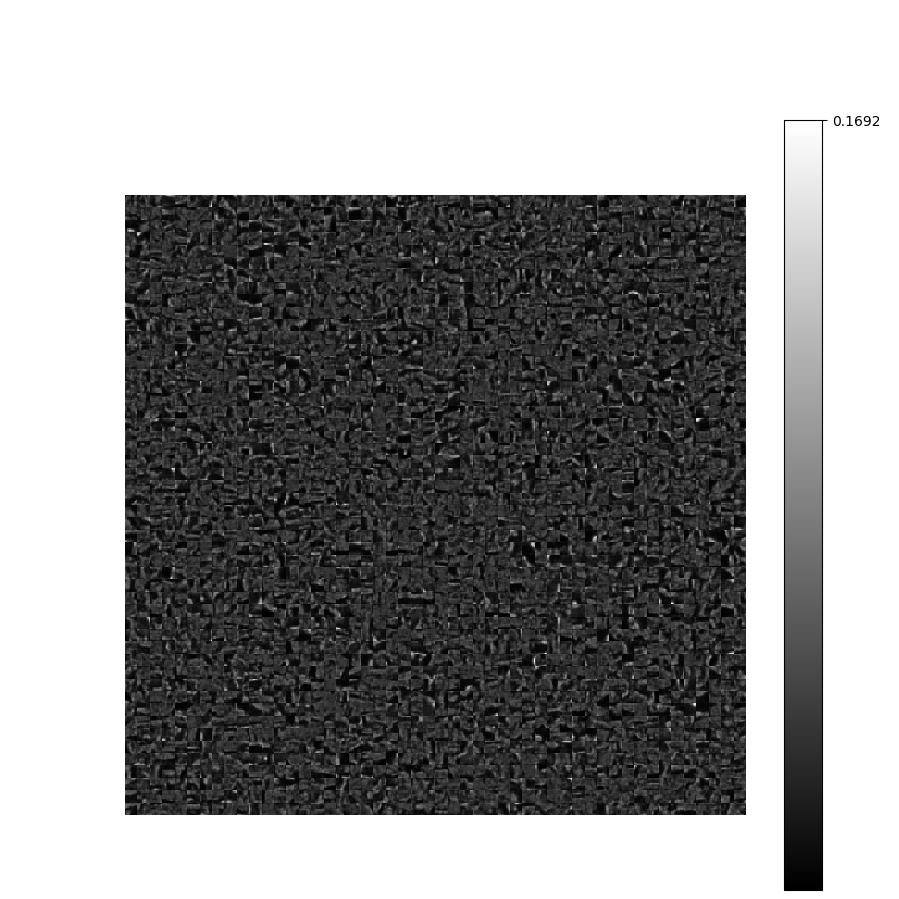

 39%|███▉      | 3892/10000 [00:02<00:03, 1668.07it/s]


KeyboardInterrupt: 

In [111]:
%matplotlib notebook
fig = plt.figure(figsize=(10, 10))

Nep = 20
T_s = 10000
prec = 1e-10

sl = 10

# Sparse Layer
Kx = 50
Ky = 50
sN = Kx * Ky
m_len = sl ** 2

n_w = 10 #Number of winners

sw = cp.random.uniform(0.4, 0.42, (sN, m_len))
xi = 0.02

for ep in range(Nep):
    inputs = gp_x10[cp.random.permutation(T_s)] 
    
    for i in tqdm(range(T_s)):

        # Handle sparse layer
        v = inputs[i].reshape(-1, 1)
        p = sw @ v
        winners = cp.argsort(p, axis=0)[-n_w:]
        mask = cp.zeros((sN, 1))
        mask[winners] = 1
        so_uw = mask * p
        r = sw.T @ so_uw
        mod_r = cp.maximum(r, prec)
        e = v - r

        sw += sw * so_uw * (e / mod_r).T * xi
        
        cp.clip(sw, 0, 1, out=sw)
        
    draw_weights(sw.get(), Kx, Ky, sl, fig)

<IPython.core.display.Javascript object>


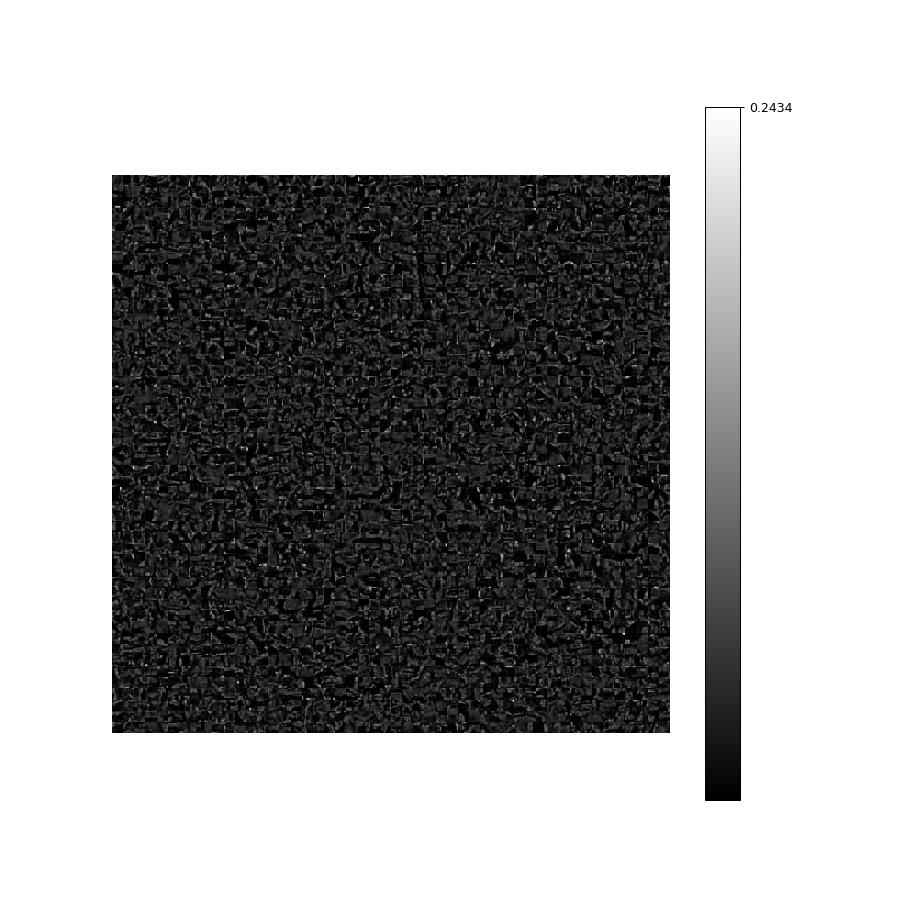

100%|██████████| 10000/10000 [00:05<00:00, 1813.11it/s]


In [112]:
%matplotlib notebook
fig = plt.figure(figsize=(10, 10))

xi = 0.07

for ep in range(Nep):
    inputs = gp_x10[cp.random.permutation(T_s)] 
    
    for i in tqdm(range(T_s)):

        # Handle sparse layer
        v = inputs[i].reshape(-1, 1)
        p = sw @ v
        winners = cp.argsort(p, axis=0)[-n_w:]
        mask = cp.zeros((sN, 1))
        mask[winners] = 1
        so_uw = mask * p
        r = sw.T @ so_uw
        mod_r = cp.maximum(r, prec)
        e = v - r

        sw += sw * so_uw * (e / mod_r).T * xi
        
        cp.clip(sw, 0, 1, out=sw)
        
    draw_weights(sw.get(), Kx, Ky, sl, fig)

That is the juice, bois.  Let's see how she does.

<IPython.core.display.Javascript object>


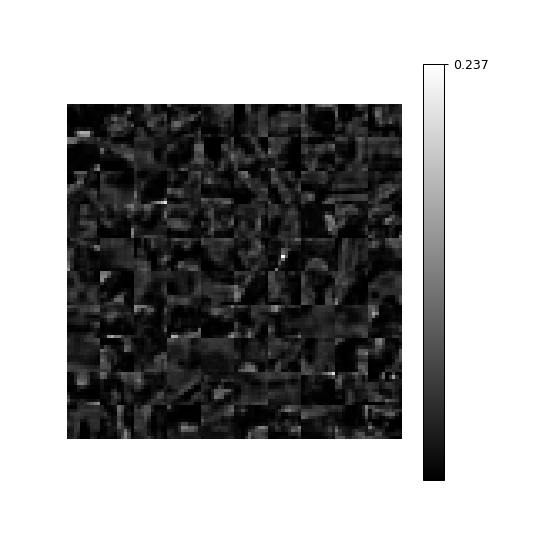

In [121]:
fig = plt.figure(figsize=(6,6))

draw_weights(sw.get()[100:], 10, 10, sl, fig)

<IPython.core.display.Javascript object>


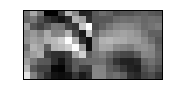

<IPython.core.display.Javascript object>


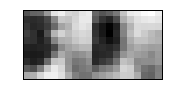

<IPython.core.display.Javascript object>


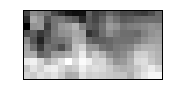

<IPython.core.display.Javascript object>


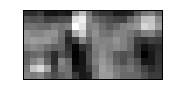

<IPython.core.display.Javascript object>


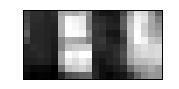

In [117]:
offset = 30

for i in range(5):
    reconstruct_te(offset + i, sw)

<IPython.core.display.Javascript object>


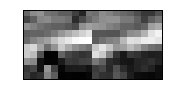

<IPython.core.display.Javascript object>


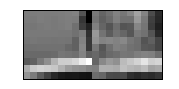

<IPython.core.display.Javascript object>


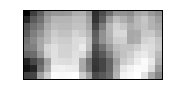

<IPython.core.display.Javascript object>


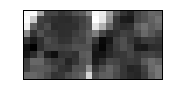

<IPython.core.display.Javascript object>


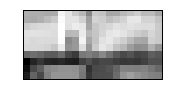

In [123]:
offset = 105


for i in range(5):
    reconstruct(offset + i, sw)

Well, there's certainly a good degree of smoothing going on.  I also increase the initialization layer so Michaelangelo could properly carve prototypes from marble (I noticed several prototypes were being left out).  

Ok, I've been probably running the p-instance for about 2 hours, so I'm going to close this bad boi up.

## Conclusions

Constant initialization is incredibly dope.  It allows the prototypes to be much smoother, which is pretty darn fantastic.  The reconstructions it produces are pretty frikin dope as well.  

Also, I've demonstrated that the network can do good reconstructions given cifar10.  Meaning, it's actually starting to find structure in the data, even if it's real world data.  That's dope.  So anyway, I'm a happy lad.

## Next steps

I need to mess with invariance a bit more, and I also need to start figuring out how to build the world-model.  Basically, the networks "looks around" an image, and is able to start figuring things out about the structure of the world all around it, even in the parts it can't see.  

It would also be super dope to build a peripheral vision-type structure so that the network is able to monitor changes in the environment using less data.  

Ideally, the network would be able to monitor its environment and "turn its eyes or head" to look at the parts that don't corroborate its world model, so that it can continually update its hypothesis about what is going on in the world.  

So yeah, invariant representations, and world model.  Also time-based structure is going to be a big thing.  That's basically almost all we have with audio.  Well, that's not quite true.  But you know what I mean.

Ok, time to shut down the p-instance.